This notebook includes 5 major parts
- Setup
- Sensitivity Analysis : execute the whole system locally to check the feasibility, grid search to see the influence of different parameters
- Test Case (Du Cane Road) : data preprocessing, training of CVAE for all 4 subdomains in terms of velocity field and concentration field
- Test Case (South Kensington) : proof of the feasibility to implement the system on a even larger scale
- Final Report Visualisation: data assimilation result and sensor error calculation

# Preliminaries

## Setup

In [1]:
!pip install livelossplot

In [3]:
import numpy as np
import sys
import os

from notebook.utils import *
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset, TensorDataset
from livelossplot import PlotLosses
import cv2
import random

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

%matplotlib inline

device = 'cpu'
if torch.cuda.device_count() > 0 and torch.cuda.is_available():
    print("Cuda installed! Running on GPU!")
    device = 'cuda'
else:
    print("No GPU available!")

Mounted at /content/gdrive
No GPU available!


## ConvVAE Structure

In [ ]:
class Conv3DAutoencoder(nn.Module):
    def __init__(self):
        super(Conv3DAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            # Input size: (3, 64, 64, 64)
            nn.Conv3d(3, 16, kernel_size=3, stride=1, padding=1),  # Output: (16, 64, 64, 64)
            nn.BatchNorm3d(16),
            nn.ELU(),
            nn.MaxPool3d((2, 2, 2)),  # Output: (16, 32, 32, 32)

            nn.Conv3d(16, 32, kernel_size=3, stride=1, padding=1),  # Output: (32, 32, 32, 32)
            nn.BatchNorm3d(32),
            nn.ELU(),
            nn.MaxPool3d((2, 2, 2)),  # Output: (32, 16, 16, 16)

            nn.Conv3d(32, 64, kernel_size=3, stride=1, padding=1),  # Output: (64, 16, 16, 16)
            nn.BatchNorm3d(64),
            nn.ELU(),
            nn.MaxPool3d((2, 1, 1)),  # Output: (64, 8, 8, 8)
        )

        # Decoder
        self.decoder = nn.Sequential(
            # Input: (64, 8, 8, 8)
            nn.ConvTranspose3d(64, 32, kernel_size=3, stride=(2, 1, 1), padding=1, output_padding=(1, 0, 0)),  # Output: (32, 16, 16, 16)
            nn.ELU(),
            nn.ConvTranspose3d(32, 16, kernel_size=3, stride=(2, 2, 2), padding=1, output_padding=(1, 1, 1)),  # Output: (16, 32, 32, 32)
            nn.ELU(),
            nn.ConvTranspose3d(16, 3, kernel_size=3, stride=(2, 2, 2), padding=1, output_padding=(1, 1, 1)),  # Output: (3, 64, 64, 64)
            nn.Identity()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [ ]:
def train_cvae(model, optimizer, train_loader, val_loader, num_epochs, adjust_batch=False):
  plot_losses = PlotLosses()

  train_losses = []
  val_losses = []

  for epoch in range(num_epochs):

    model.train()
    train_loss = 0
    for data in train_loader:
        if adjust_batch:
            for chunk in torch.split(data[0], 25):
                img = chunk.to(device)
                optimizer.zero_grad()
                output = model(img)
                loss = criterion(output, img)
                loss.backward()
                optimizer.step()
                train_loss += loss.item()
        else:
            img = data[0].to(device)
            optimizer.zero_grad()
            output = model(img)
            loss = criterion(output, img)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

    train_loss /= len(train_loader)
    train_losses.append(train_loss)


    model.eval()
    val_loss = 0
    with torch.no_grad():
        for data in val_loader:
            if adjust_batch:
                for chunk in torch.split(data[0], 25):
                    img = chunk.to(device)
                    output = model(img)
                    loss = criterion(output, img)
                    val_loss += loss.item()
            else:
                img = data[0].to(device)
                output = model(img)
                loss = criterion(output, img)
                val_loss += loss.item()

    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    plot_losses.update({
        'train_loss': torch.log(torch.tensor(train_loss)),
        'val_loss': torch.log(torch.tensor(val_loss))
    })
    plot_losses.draw()

    print(f"Epoch {epoch+1}, Train Loss (log): {train_loss}, Val Loss (log): {val_loss}")


In [ ]:
from pickle import NONE
def reconstruct(model, data_loader, latent_repr=None):
    model.eval()
    original_data = []
    reconstructed_data = []

    if latent_repr is None:
        with torch.no_grad():
            for data in data_loader:
                # Pass the images through the encoder to get the latent representation and decode it back
                img = data[0].to(device)
                latent_repr = model.encoder(img)  # torch.Size([batch size, 64, 8, 16, 16])
                reconstructed = model.decoder(latent_repr)

                original_data.append(img.cpu())
                reconstructed_data.append(reconstructed.cpu())

                del img, latent_repr, reconstructed
                torch.cuda.empty_cache()
    else:
        # get the latent_repr as parameters (for sensitivity analysis)
        # also torch.no_grad() disables gradient computation
        for idx, data in enumerate(data_loader):
            img = data[0].to(device)
            reconstructed = model.decoder(latent_repr[idx])

            original_data.append(img.cpu())
            reconstructed_data.append(reconstructed.cpu())

            del img, reconstructed
            torch.cuda.empty_cache()

    # Concatenate all batches into a single tensor for original and reconstructed data.
    original_data = torch.cat(original_data)
    reconstructed_data = torch.cat(reconstructed_data)

    return original_data, reconstructed_data

In [ ]:
def visualize_recon(original_data, reconstructed_data):
    random_indices = [1, 2, 3, 4, 20, 40, 60]
    num_channels = 3

    # Plot original and reconstructed images
    fig, axes = plt.subplots(6, len(random_indices), figsize=(20, 20))

    for channel in range(num_channels):
        for i, idx in enumerate(random_indices):
            # choose the last time step 10000 (first element)
            original = original_data[0, channel, idx, :, :].numpy()  # Choosing different height
            reconstructed = reconstructed_data[0, channel, idx, :, :].numpy()

            # Plot original image
            axes[channel * 2, i].imshow(original)
            axes[channel * 2, i].set_title(f'Original Channel = {channel}, z = {idx + 1}')
            axes[channel * 2, i].axis('off')

            # Plot reconstructed image
            axes[channel * 2 + 1, i].imshow(reconstructed)
            axes[channel * 2 + 1, i].set_title(f'Recon Channel = {channel}, z = {idx + 1}')
            axes[channel * 2 + 1, i].axis('off')

    plt.tight_layout()
    plt.show()

# Sensitivity Analysis

### sensitivity util

In [ ]:
# parameters
ntime = 5  # number of iteration for the whole code
dt = 0.5
iteration = 5  # for multigird method

# Initialize input tensors
input_shape = (1, 1, 64, 512, 512)
values_u = torch.zeros(input_shape, device=device)
values_v = torch.zeros(input_shape, device=device)
values_w = torch.zeros(input_shape, device=device)
values_p = torch.zeros(input_shape, device=device)
w = torch.zeros(input_shape, device=device)
r = torch.zeros(input_shape, device=device)
k1 = torch.ones(input_shape, device=device) * 2.0
input_shape_pad = (1, 1, 64+2, 512+2, 512+2)
values_uu = torch.zeros(input_shape_pad, device=device)
values_vv = torch.zeros(input_shape_pad, device=device)
values_ww = torch.zeros(input_shape_pad, device=device)
values_pp = torch.zeros(input_shape_pad, device=device)
b_uu = torch.zeros(input_shape_pad, device=device)
b_vv = torch.zeros(input_shape_pad, device=device)
b_ww = torch.zeros(input_shape_pad, device=device)
k_uu = torch.zeros(input_shape_pad, device=device)
k_vv = torch.zeros(input_shape_pad, device=device)
k_ww = torch.zeros(input_shape_pad, device=device)

**get the latent variables from encoder as parameters (z)**

In [ ]:
# Function to extract latent space representation
def get_latent_representation(model, input_tensor):
    with torch.no_grad():  # Disable gradient computation
        model.eval()  # Set the model to evaluation mode
        latent_representation = model.encoder(input_tensor)
    return latent_representation

In [ ]:
def visualize_recon_progress(recon_progress, init_data, obs_data):
    random_indices = [3, 13, 23, 33, 43, 53, 63]
    num_channels = 3

    # Plot original and reconstructed images
    fig, axes = plt.subplots(len(recon_progress)+2, len(random_indices), figsize=(20, 20))

    # initial condition
    for i, idx in enumerate(random_indices):
        axes[0, i].imshow(init_data[1, 0, idx, :, :]) #.detach().numpy())
        axes[0, i].set_title(f'Init z = {idx + 1}')
        axes[0, i].axis('off')

    for iter in range(len(recon_progress)):
        for i, idx in enumerate(random_indices):
            reconstructed = recon_progress[iter][0, 0, idx, :, :].detach().numpy()

            # Plot reconstructed image
            axes[iter + 1, i].imshow(reconstructed)
            axes[iter + 1, i].set_title(f'Iter = {iter}, z = {idx + 1}')
            axes[iter + 1, i].axis('off')

    # last row is the observation data
    for i, idx in enumerate(random_indices):
        axes[-1, i].imshow(obs_data[0, 0, idx, :, :]) #.detach().numpy())
        axes[-1, i].set_title(f'OBS z = {idx + 1}')
        axes[-1, i].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Define a sensitivity analysis function
def sensitivity_analysis(cvae_model, ai4urban_model, optimizer, ntime, iter_sensitivity, latent_representations, obs_data, values_p, values_uu, values_vv, values_ww, values_pp, b_uu, b_vv, b_ww, k1, dt, iteration, k_uu, k_vv, k_ww):

    for name, param in cvae_model.named_parameters():
        if 'decoder' in name:
            param.requires_grad = True
            print(f"{name} is a leaf node.")
        else:
            param.requires_grad = False

    # Initialize variables
    original_data, reconstructed_data = None, None
    recon_progress = []
    for iter in range(iter_sensitivity):
        optimizer.zero_grad()

        # Enable anomaly detection
        torch.autograd.set_detect_anomaly(True)

        # Set latent_variable as input to the decoder
        original_data, reconstructed_data = reconstruct(cvae_model, test_loader, latent_repr=latent_representations)
        reconstructed_data = normalization(reconstructed_data)  # normalization
        # print("Shape of reconstructed_data:", reconstructed_data.shape)

        # Forward pass through AI4Urban model with reconstructed data
        # Create clones to avoid in-place modifications
        values_u_clone = reconstructed_data[1, 0, :, :, :].clone() ; values_v_clone = reconstructed_data[1, 1, :, :, :].clone() ; values_w_clone = reconstructed_data[1, 2, :, :, :].clone()
        values_uu_clone = values_uu.clone().detach() ; values_vv_clone = values_vv.clone().detach() ; values_ww_clone = values_ww.clone().detach()
        values_p_clone = values_p.clone().detach() ; values_pp_clone = values_pp.clone().detach() ; k1_clone = k1.clone().detach()
        b_uu_clone = b_uu.clone().detach() ; b_vv_clone = b_vv.clone().detach() ; b_ww_clone = b_ww.clone().detach()
        k_uu_clone = k_uu.clone().detach() ; k_vv_clone = k_vv.clone().detach() ; k_ww_clone = k_ww.clone().detach()

        # print_data_stats("initial condition stat", torch.tensor(reconstructed_data[1]))

        # Debug: Print tensor properties before using them in the model
        # print(f"\nvalues_u_clone requires_grad: {values_u_clone.requires_grad}")
        # print(f"values_v_clone requires_grad: {values_v_clone.requires_grad}")
        # print(f"values_w_clone requires_grad: {values_w_clone.requires_grad}")

        # Run AI4Urban model
        # with torch.no_grad():
        for itime in range(1,ntime+1):
            # print(f"ai4urban iteration {itime}")
            values_u, values_v, values_w, values_p, w, r = ai4urban_model(values_u_clone, values_uu_clone, values_v_clone, values_vv_clone, values_w_clone, values_ww_clone, values_p_clone, values_pp_clone, b_uu_clone, b_vv_clone, b_ww_clone, k1_clone, dt, iteration, k_uu_clone, k_vv_clone, k_ww_clone)
            values_u_clone = values_u.clone(); values_v_clone = values_v.clone(); values_w_clone = values_w.clone()
        print(f"\nai4urban iterations done\n")


        # print_data_stats("after ai4urban stat", torch.cat((values_u, values_v, values_w), dim=1))
        # print_data_stats("obs stat", torch.tensor(obs_data))

        # Concatenate model outputs
        values_uvw = normalization(torch.cat((values_u, values_v, values_w), dim=1))  # Shape: [1, 3, 64, x, x]
        values_uvw_obs = normalization(torch.tensor(obs_data))

        # print_data_stats("after ai4urban stat (after normalization)", values_uvw)
        # print_data_stats("obs stat (after normalization)", values_uvw_obs)

        ### Geo-twin
        # pick some random sensors for example
        sensor_1, obs_1 = values_uvw[0, :, 0, 7, 28], values_uvw_obs[0, :, 0, 7, 28]
        sensor_2, obs_2 = values_uvw[0, :, 15, 43, 60], values_uvw_obs[0, :, 15, 43, 60]
        sensor_3, obs_3 = values_uvw[0, :, 37, 22, 45], values_uvw_obs[0, :, 37, 22, 45]
        print(f"\nSensor 1 initial condition: {reconstructed_data[1, :, 0, 7, 28]}")
        print(f"Sensor 1 after ai4urban: {sensor_1}")
        print(f"Sensor 1 observation data: {obs_1}\n")

        print(f"Sensor 1 Relative Error: {(sensor_1 - obs_1) / obs_1}")
        print(f"Sensor 2 Relative Error: {(sensor_2 - obs_2) / obs_2}")
        print(f"Sensor 3 Relative Error: {(sensor_3 - obs_3) / obs_3}\n")


        # save the output
        # if (iter == 0) or (iter % 3 == 0):
        #     recon_progress.append(values_uvw)
        recon_progress.append(values_uvw)

        # loss function
        loss = nn.MSELoss()(values_uvw, values_uvw_obs)

        # Backward pass to compute gradients
        loss.backward(retain_graph=True)
        torch.nn.utils.clip_grad_norm_(cvae_model.parameters(), 1.0)  # Clip gradients (prevent from gradient explosion)

        # Access gradients of leaf nodes
        for name, param in cvae_model.named_parameters():
            if param.requires_grad:
                # print(f"Shape of gradient of {name}: {param.grad.shape}")
                print(f"Max gradient of {name}: {torch.max(param.grad)}")

        print(f"\nModel parameters updated!")

        print(f"\n----------Sensitivity Analysis Iteration {iter+1} Done, loss: {loss.item()}----------\n")

        # Update model parameters
        optimizer.step()

        # Delete unused variables to free up memory
        del reconstructed_data, values_u_clone, values_v_clone, values_w_clone
        # del values_uu_clone, values_vv_clone, values_ww_clone, values_p_clone, values_pp_clone
        # del k1_clone, b_uu_clone, b_vv_clone, b_ww_clone, k_uu_clone, k_vv_clone, k_ww_clone
        # del values_u, values_v, values_w, values_p, w, r, sensor_1, obs_1, sensor_2, obs_2, sensor_3, obs_3, values_uvw, values_uvw_obs
        torch.cuda.empty_cache()

    return original_data, recon_progress

### CVAE + CFD + DA (small test case)

In [ ]:
sys.path.append('/content/gdrive/My Drive/IRP')

# AI4Urban
import AI4Urban_model

AI4Urban_model = AI4Urban_model.AI4Urban().to(device)
optimizer = optim.Adam(AI4Urban_model.parameters(), lr=1e-4, weight_decay=1e-5) # L2 regularization with weight decay
criterion = nn.MSELoss()

# CVAE decoder
streets_model_simple = Conv3DAutoencoder().to(device)
streets_model_simple.load_state_dict(torch.load('/content/gdrive/My Drive/streets_model_1000.pth', map_location=torch.device('cpu')))

# data
data_streets = np.load("/content/gdrive/My Drive/IRP/streets/final_combined_data.npy")
dataset_streets = TensorDataset(torch.from_numpy(data_streets))
data_loader_streets = DataLoader(dataset_streets, batch_size=64, shuffle=True)
print("Data shape: ", data_streets.shape)
train_loader, val_loader, test_loader = split_data(data_streets)

obs_data = np.load("/content/gdrive/My Drive/IRP/streets/combined_data_10000.npy")
obs_data = np.expand_dims(obs_data, axis=0)
print("obs shape: ", obs_data.shape)


# Iterate over the test_loader to process each batch individually
latent_representations = []
for batch in test_loader:
    input_tensor = batch[0].to(device)
    latent_representation = get_latent_representation(streets_model_simple, input_tensor)
    latent_representations.append(latent_representation)


print(f"Latent representation shape (first batch): {latent_representations[0].shape}")

# Reconstruct the images with unseen data (test set) -> this step in sensitivity
original_data, reconstructed_data = reconstruct(streets_model_simple, test_loader, latent_repr=latent_representations)
print(original_data.shape, reconstructed_data.shape)
mse = F.mse_loss(reconstructed_data, original_data, reduction='mean').item()
print(f"Mean Squared Error on dataset: {mse}")

Running on GPU:  False
Data shape:  (20, 3, 64, 64, 64)
Train shape: (16, 3, 64, 64, 64),
Validation shape: (2, 3, 64, 64, 64), 
Test shape: (2, 3, 64, 64, 64)
obs shape:  (1, 3, 64, 64, 64)
Latent representation shape (first batch): torch.Size([2, 64, 8, 16, 16])
torch.Size([2, 3, 64, 64, 64]) torch.Size([2, 3, 64, 64, 64])
Mean Squared Error on dataset: 0.00036425600410439074


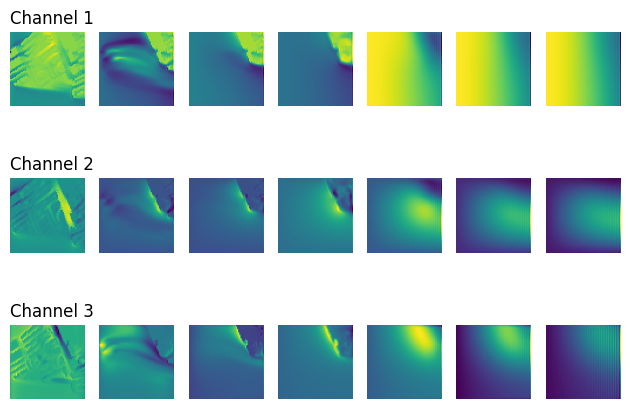

In [ ]:
visualize_data(obs_data[0])

In [ ]:
# Run sensitivity analysis 1, 5, normalisation (both), pseudo data
original_data, recon_progress = sensitivity_analysis(streets_model_simple, AI4Urban_model, optimizer, ntime, num_iter, latent_representations, obs_data , values_p, values_uu, values_vv, values_ww, values_pp, b_uu, b_vv, b_ww, k1, dt, iteration, k_uu, k_vv, k_ww)

decoder.0.weight is a leaf node.
decoder.0.bias is a leaf node.
decoder.2.weight is a leaf node.
decoder.2.bias is a leaf node.
decoder.4.weight is a leaf node.
decoder.4.bias is a leaf node.

ai4urban iterations done


Sensor 1 initial condition: tensor([0.2130, 0.2098, 0.2110], grad_fn=<SelectBackward0>)
Sensor 1 after ai4urban: tensor([0.3015, 0.3015, 0.3015], grad_fn=<SelectBackward0>)
Sensor 1 observation data: tensor([0.3174, 0.3174, 0.3174])

Sensor 1 Relative Error: tensor([-0.0502, -0.0502, -0.0502], grad_fn=<DivBackward0>)
Sensor 2 Relative Error: tensor([-0.7422,  0.4814,  0.4488], grad_fn=<DivBackward0>)
Sensor 3 Relative Error: tensor([-0.9000,  0.3515,  0.3295], grad_fn=<DivBackward0>)

Max gradient of decoder.0.weight: 0.033769432455301285
Max gradient of decoder.0.bias: 0.004225913435220718
Max gradient of decoder.2.weight: 0.04167616367340088
Max gradient of decoder.2.bias: 0.014160465449094772
Max gradient of decoder.4.weight: 0.040107544511556625
Max gradient of deco

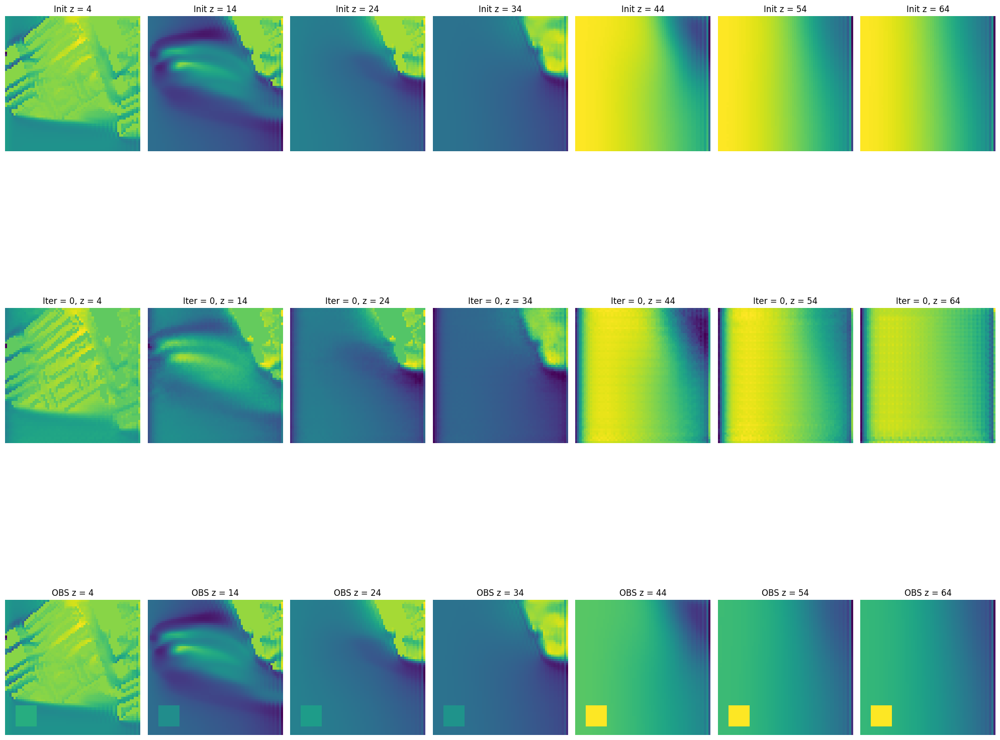

In [ ]:
visualize_recon_progress(recon_progress, original_data, obs_data)

### Grid Search

**Grid Search**
- time steps for CFD: 1, 2, 3, 5 (due to memory limitation, a maximum of 5 time steps can be executed on Colab)
- Data Assimilation Loops: 2, 3, 5
- Normalisation: True, False

**Observation**
- Result with normalisation is more stable
- Both time steps for CFD and iterations for DA contribute positively to the result
- There is a trade-off between available computing resources and the accurucy of the model

In [ ]:
# Run sensitivity analysis 2, 3, normalisation (both)
original_data, recon_progress = sensitivity_analysis(streets_model_simple, AI4Urban_model, optimizer, ntime, num_iter, latent_representations, obs_data , values_p, values_uu, values_vv, values_ww, values_pp, b_uu, b_vv, b_ww, k1, dt, iteration, k_uu, k_vv, k_ww)

decoder.0.weight is a leaf node.
decoder.0.bias is a leaf node.
decoder.2.weight is a leaf node.
decoder.2.bias is a leaf node.
decoder.4.weight is a leaf node.
decoder.4.bias is a leaf node.

ai4urban iterations done


Sensor 1 initial condition: tensor([0.2130, 0.2098, 0.2110], grad_fn=<SelectBackward0>)
Sensor 1 after ai4urban: tensor([0.2131, 0.2131, 0.2131], grad_fn=<SelectBackward0>)
Sensor 1 observation data: tensor([0.3174, 0.3174, 0.3174])

Sensor 1 Relative Error: tensor([-0.3286, -0.3286, -0.3286], grad_fn=<DivBackward0>)
Sensor 2 Relative Error: tensor([-0.2831,  0.2573,  0.2552], grad_fn=<DivBackward0>)
Sensor 3 Relative Error: tensor([-0.2835,  0.1987,  0.2252], grad_fn=<DivBackward0>)

Max gradient of decoder.0.weight: 0.03229634836316109
Max gradient of decoder.0.bias: 0.0031975076999515295
Max gradient of decoder.2.weight: 0.03858736902475357
Max gradient of decoder.2.bias: 0.016638869419693947
Max gradient of decoder.4.weight: 0.04762134328484535
Max gradient of decod

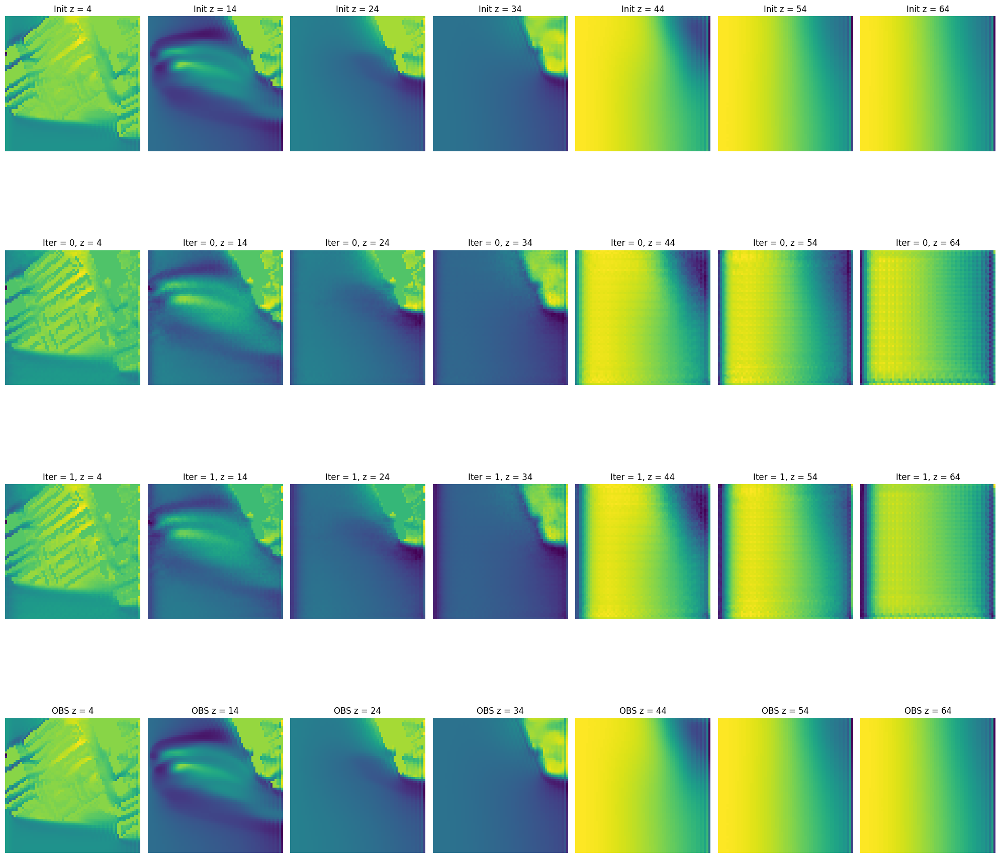

In [ ]:
visualize_recon_progress(recon_progress, original_data, obs_data)

In [ ]:
# Run sensitivity analysis 2, 3, normalisation (both)
recon_progress = sensitivity_analysis(streets_model_simple, AI4Urban_model, optimizer, ntime, num_iter, latent_representations, obs_data , values_p, values_uu, values_vv, values_ww, values_pp, b_uu, b_vv, b_ww, k1, dt, iteration, k_uu, k_vv, k_ww)

decoder.0.weight is a leaf node.
decoder.0.bias is a leaf node.
decoder.2.weight is a leaf node.
decoder.2.bias is a leaf node.
decoder.4.weight is a leaf node.
decoder.4.bias is a leaf node.

ai4urban iterations done


Sensor 1 initial condition: tensor([0.2130, 0.2098, 0.2110], grad_fn=<SelectBackward0>)
Sensor 1 after ai4urban: tensor([0.2131, 0.2131, 0.2131], grad_fn=<SelectBackward0>)
Sensor 1 observation data: tensor([0.3174, 0.3174, 0.3174])

Sensor 1 Relative Error: tensor([-0.3286, -0.3286, -0.3286], grad_fn=<DivBackward0>)
Sensor 2 Relative Error: tensor([-0.2831,  0.2573,  0.2552], grad_fn=<DivBackward0>)
Sensor 3 Relative Error: tensor([-0.2835,  0.1987,  0.2252], grad_fn=<DivBackward0>)

Max gradient of decoder.0.weight: 0.03229634836316109
Max gradient of decoder.0.bias: 0.0031975076999515295
Max gradient of decoder.2.weight: 0.03858736902475357
Max gradient of decoder.2.bias: 0.016638869419693947
Max gradient of decoder.4.weight: 0.04762134328484535
Max gradient of decod

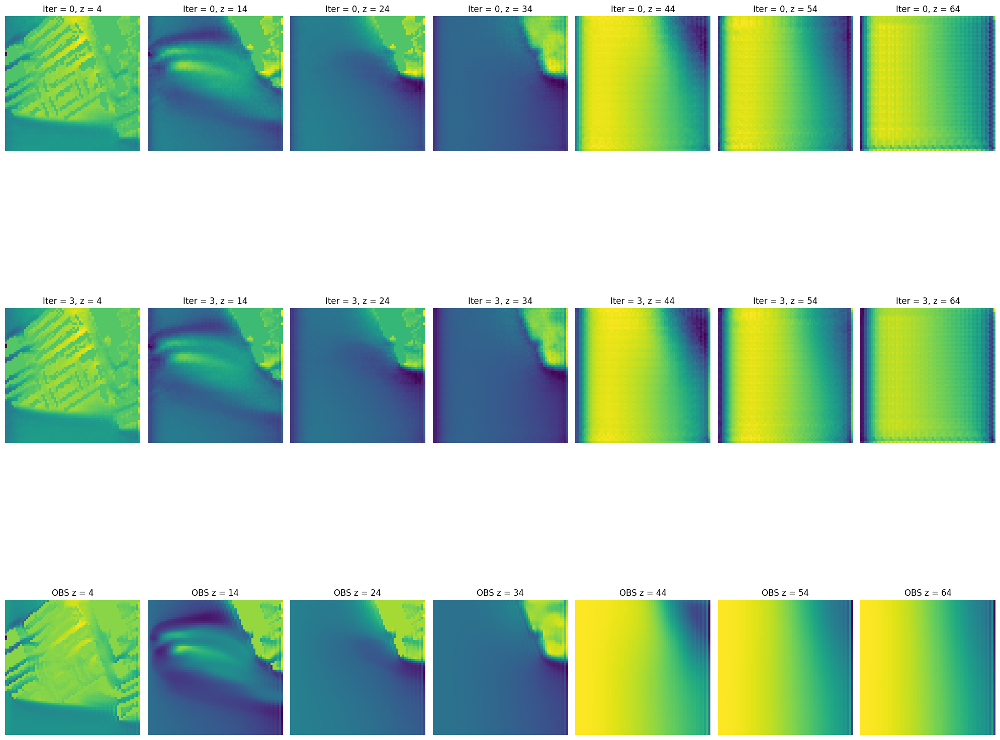

In [ ]:
visualize_recon_progress(recon_progress, obs_data)

In [ ]:
# Run sensitivity analysis 1, 5, normalisation (only obs)
recon_progress = sensitivity_analysis(streets_model_simple, AI4Urban_model, optimizer, ntime, num_iter, latent_representations, obs_data , values_p, values_uu, values_vv, values_ww, values_pp, b_uu, b_vv, b_ww, k1, dt, iteration, k_uu, k_vv, k_ww)

decoder.0.weight is a leaf node.
decoder.0.bias is a leaf node.
decoder.2.weight is a leaf node.
decoder.2.bias is a leaf node.
decoder.4.weight is a leaf node.
decoder.4.bias is a leaf node.

Sensor 1 initial condition: tensor([0.3149, 0.3121, 0.3131], grad_fn=<SelectBackward0>)

ai4urban iteration 1000 done

Sensor 1 after 1000 ai4urban iterations : tensor([-2.5402e-11,  8.4174e-11,  1.9761e-11], grad_fn=<SelectBackward0>)
Sensor 2 observation data : tensor([0.3174, 0.3174, 0.3174])

Sensor 1 Relative Error: tensor([-1., -1., -1.], grad_fn=<DivBackward0>)
Sensor 2 Relative Error: tensor([-0.0226, -0.0305, -0.0318], grad_fn=<DivBackward0>)
Sensor 3 Relative Error: tensor([ 0.0643, -0.0219,  0.0234], grad_fn=<DivBackward0>)

Max gradient of decoder.0.weight: 0.00020258166478015482
Max gradient of decoder.0.bias: 0.000284413545159623
Max gradient of decoder.2.weight: 0.0005357991904020309
Max gradient of decoder.2.bias: 0.0014756573364138603
Max gradient of decoder.4.weight: 0.000959456

In [ ]:
# Run sensitivity analysis 3, 3
recon_progress = sensitivity_analysis(streets_model_simple, AI4Urban_model, optimizer, ntime, num_iter, latent_representations, obs_data , values_p, values_uu, values_vv, values_ww, values_pp, b_uu, b_vv, b_ww, k1, dt, iteration, k_uu, k_vv, k_ww)

decoder.0.weight is a leaf node.
decoder.0.bias is a leaf node.
decoder.2.weight is a leaf node.
decoder.2.bias is a leaf node.
decoder.4.weight is a leaf node.
decoder.4.bias is a leaf node.

ai4urban iteration 1000 done

Sensor 1 Relative Error: tensor([0.1977, 1.4040, 0.8334], grad_fn=<DivBackward0>)
Sensor 2 Relative Error: tensor([-0.8043, 12.6635,  3.3656], grad_fn=<DivBackward0>)
Sensor 3 Relative Error: tensor([-0.8148,  0.5459,  0.1742], grad_fn=<DivBackward0>)
Max gradient of decoder.0.weight: 0.005244473926723003
Max gradient of decoder.0.bias: 0.021023066714406013
Max gradient of decoder.2.weight: 0.02237117476761341
Max gradient of decoder.2.bias: 0.10620742291212082
Max gradient of decoder.4.weight: 0.045597825199365616
Max gradient of decoder.4.bias: 0.4633272886276245

Model parameters updated!

----------Sensitivity Analysis Iteration 1 Done, loss: 0.30973103642463684----------


ai4urban iteration 1000 done

Sensor 1 Relative Error: tensor([ -0.1427,   0.8690, -12.643

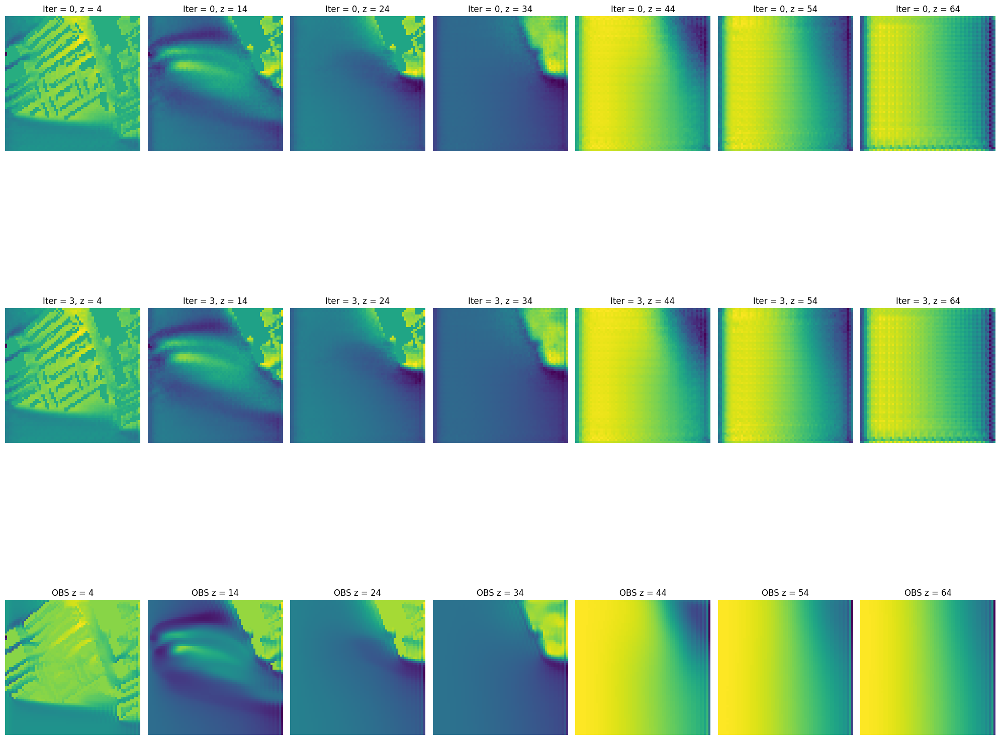

In [ ]:
visualize_recon_progress(recon_progress, obs_data)

# Test Case: Du Cane Road (64, 512, 512)

### Data

(1, 512, 512, 64, 1) torch.Size([1, 1, 64, 512, 512])


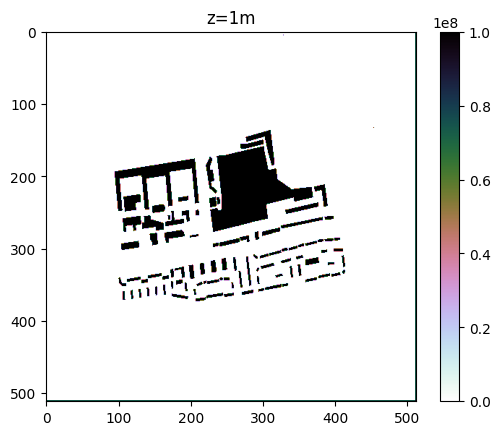

In [50]:
# Numerial parameters
nx, ny, nz = 512, 512, 64
input_shape = (1,1,nz,ny,nx)

mesh = np.load("/content/gdrive/My Drive/IRP/Urban_street.npy")
sigma = torch.zeros(input_shape, dtype=torch.float32, device=device)
print(mesh.shape, sigma.shape)
for i in range(nz):
    sigma[0,0,i,:,:] = torch.tensor(mesh[0,:,:,i,0])
sigma = sigma.transpose_(4, 3)
sigma = torch.flip(sigma, [3])
sigma = torch.where(sigma == 0, torch.tensor(1e08, dtype=torch.float32, device=device), torch.tensor(0, dtype=torch.float32, device=device))
plt.imshow(sigma[0,0,1,:,:].cpu())
plt.title("z=1m")
plt.colorbar()

(1, 512, 512, 64, 1) torch.Size([1, 1, 64, 512, 512])


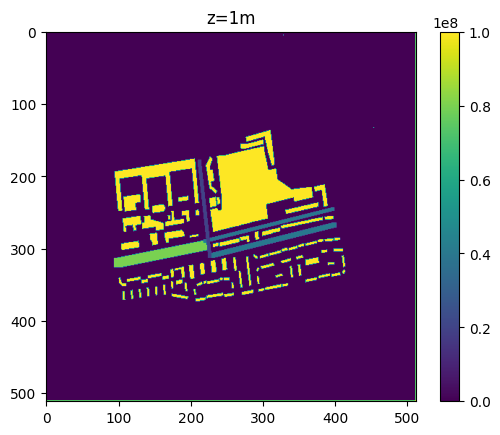

In [ ]:
# Numerial parameters
nx, ny, nz = 512, 512, 64
input_shape = (1,1,nz,ny,nx)

mesh = np.load("/content/gdrive/My Drive/IRP/Urban_street.npy")
sigma = torch.zeros(input_shape, dtype=torch.float32, device=device)
print(mesh.shape, sigma.shape)
for i in range(nz):
    sigma[0,0,i,:,:] = torch.tensor(mesh[0,:,:,i,0])
sigma = sigma.transpose_(4, 3)
sigma = torch.flip(sigma, [3])
sigma = torch.where(sigma == 0, torch.tensor(1e08, dtype=torch.float32, device=device), torch.tensor(0, dtype=torch.float32, device=device))

# z=2 horizontal
create_zigzag_pattern(sigma, start_row=320, end_row=350, start_col=100, end_col=225, z_index=1, value=8e07, slope_row=-1, slope_col=5, thickness=6, device=device)
create_zigzag_pattern(sigma, start_row=290, end_row=350, start_col=220, end_col=400, z_index=1, value=4e07, slope_row=-1, slope_col=4, thickness=2, device=device)
create_zigzag_pattern(sigma, start_row=310, end_row=350, start_col=230, end_col=400, z_index=1, value=4e07, slope_row=-1, slope_col=4, thickness=3, device=device)

# z=2 vertical
create_zigzag_pattern(sigma, start_row=180, end_row=310, start_col=212, end_col=380, z_index=1, value=2e07, slope_row=9, slope_col=1, thickness=2, device=device)
create_zigzag_pattern(sigma, start_row=185, end_row=315, start_col=212, end_col=380, z_index=1, value=2e07, slope_row=9, slope_col=1, thickness=2, device=device)

plt.imshow(sigma[0,0,1,:,:].cpu(), cmap='cubehelix_r')
plt.title("z=1m")
plt.colorbar()

In [ ]:
# base_path = "/content/gdrive/My Drive/IRP/Urban_street"
# prefixes = ["u", "v", "w"]
# steps = range(1000, 10000 + 1, 1000)
# combine_and_save_data(base_path, prefixes, steps)
# final_combine(base_path, steps)

data_street = np.load("/content/gdrive/My Drive/IRP/Urban_street/final_combined_data.npy")

(10, 3, 64, 512, 512)

(3, 64, 512, 512)


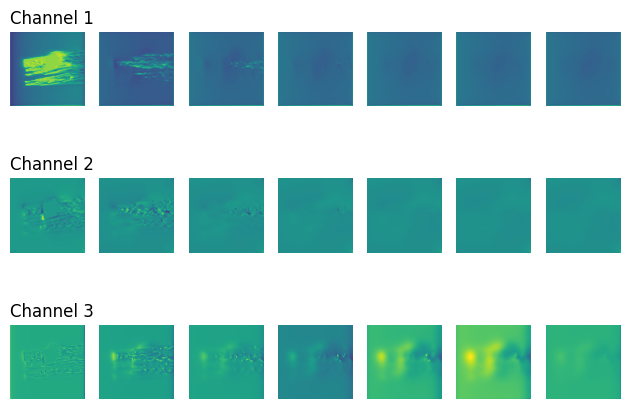

In [ ]:
data_test = np.load("/content/gdrive/My Drive/IRP/Urban_street/combined_data_10000.npy")
data_test = normalization(data_test)
visualize_data(data_test)

### Data Preprocessing (divide into 4 subdomains)

In [ ]:
# base_path = "/content/gdrive/My Drive/IRP/Urban_street_source/data"
# prefixes = ["p"]
# steps = range(1000, 10000 + 1, 1000)
# combine_and_save_data(base_path, prefixes, steps)
# final_combine(base_path, steps)
data_street = np.load("/content/gdrive/My Drive/IRP/Urban_street_source/data/final_combined_data_p.npy")
print(data_street.shape)

(10, 1, 64, 512, 512)


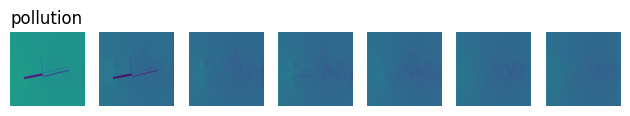

In [ ]:
data_test = np.load("/content/gdrive/My Drive/IRP/Urban_street_source/data/p10000.npy")
data_test = normalization(data_test)
visualize_p(np.expand_dims(data_test, axis=0))

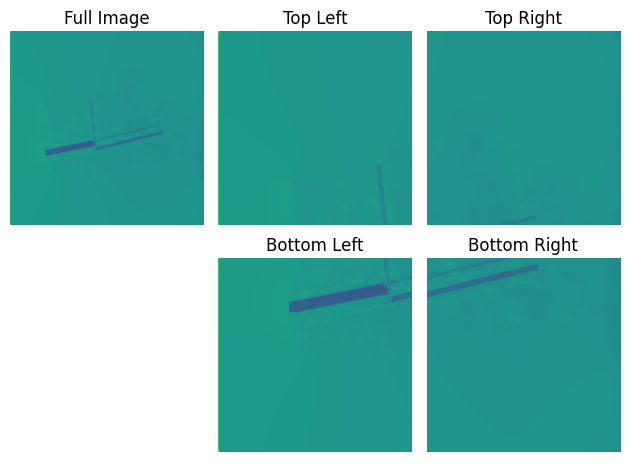

In [ ]:
show_subdomain(data_test, 2)

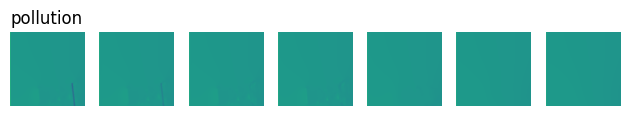

In [ ]:
data_256_1 = data_street[:,:,:, :256, :256]
visualize_p(data_256_1[9], vmin, vmax)

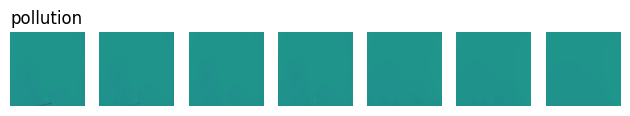

In [ ]:
data_256_2 = data_street[:,:,:, :256, 256:]
visualize_p(data_256_2[9], vmin, vmax)

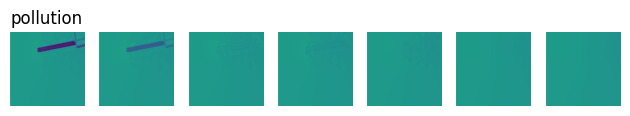

In [ ]:
data_256_3 = data_street[:,:,:, 256:, :256]
visualize_p(data_256_3[9], vmin, vmax)

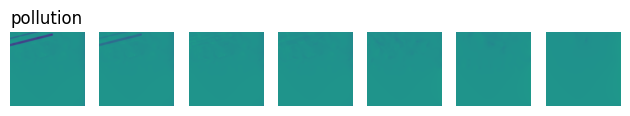

In [ ]:
data_256_4 = data_street[:,:,:, 256:, 256:]
visualize_p(data_256_4[9], vmin, vmax)

## Subdomain: Top Left

### Mode: velocity, Subdomain: Top Left

In [ ]:
data_256_1 = np.load("/content/gdrive/My Drive/IRP/Urban_street/256_1.npy")
print(data_256_1.shape)

(10, 3, 64, 256, 256)


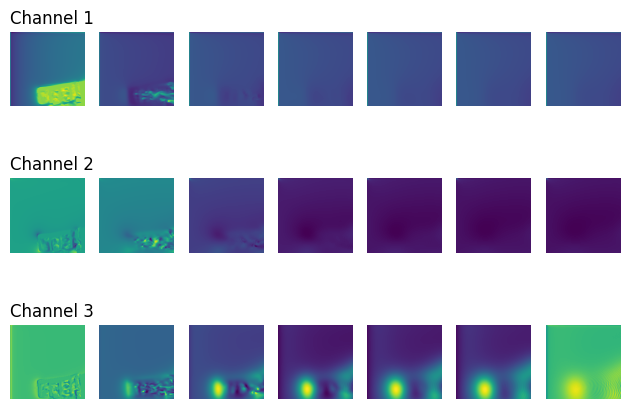

In [ ]:
visualize_data(data_256_1[9])

In [ ]:
data_street_downsampled_overlap = data_downsample_overlap(data_256_1, block_size=64, overlap_ratio=(0.5, 0.5))
print(data_street_downsampled_overlap.shape)
# np.save('/content/gdrive/My Drive/IRP/Urban_street/data_street_downsampled_overlap.npy', data_street_downsampled_overlap)

(490, 3, 64, 64, 64)


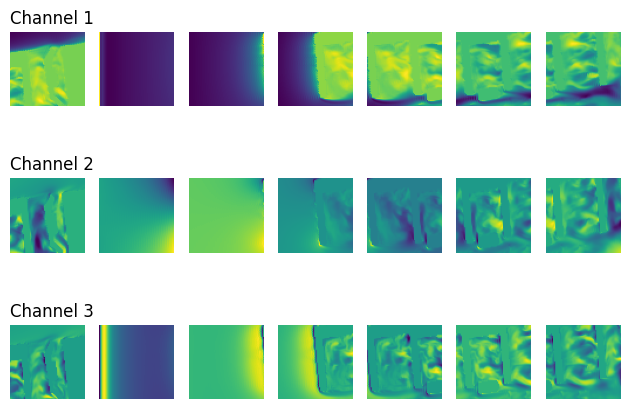

In [ ]:
show_overlapping(data_street_downsampled_overlap, np.arange(482, 489))

In [ ]:
train_loader, val_loader, test_loader = split_data(data_street_downsampled_overlap, rotation=True)

before rotation: 
 [0.26279604 0.26279604 0.26279604 0.26279604 0.26279604] ...
after rotation: 
 [ 0.26279604 -0.10795325 -0.31974804 -0.4704402  -0.55915666] ...
Train shape: (392, 3, 64, 64, 64),
Validation shape: (49, 3, 64, 64, 64), 
Test shape: (49, 3, 64, 64, 64)


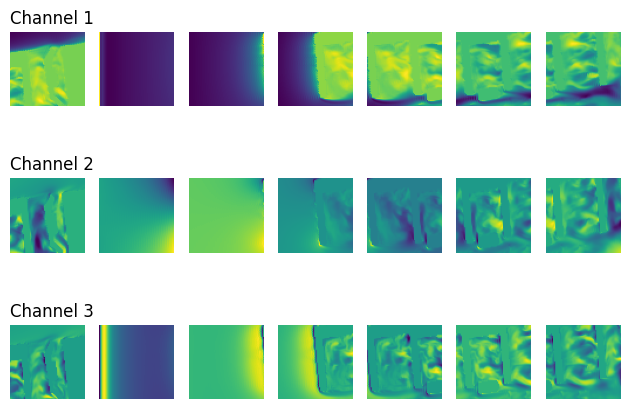

In [ ]:
show_overlapping(data_street_downsampled_overlap, np.arange(482, 489))

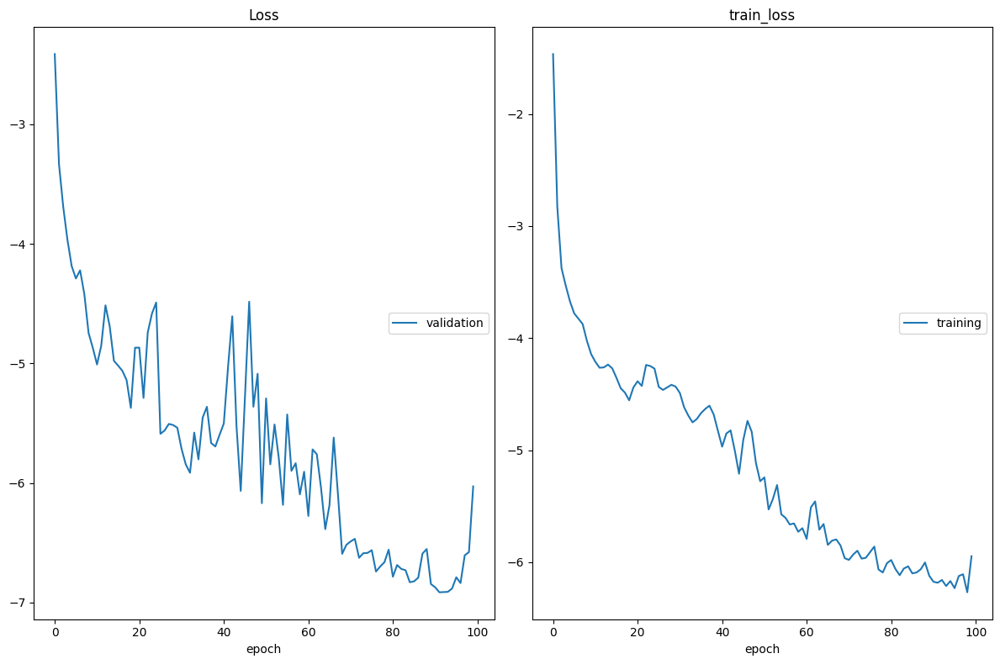

Loss
	validation       	 (min:   -6.914, max:   -2.412, cur:   -6.029)
train_loss
	training         	 (min:   -6.270, max:   -1.465, cur:   -5.947)
Epoch 100, Train Loss (log): 0.002612651813251432, Val Loss (log): 0.002409102744422853


In [ ]:
street_overlapping_model = Conv3DAutoencoder().to(device)
optimizer = optim.Adam(street_overlapping_model.parameters(), lr=1e-3, betas=(0.9, 0.999))
criterion = nn.MSELoss()

train_cvae(street_overlapping_model, optimizer, train_loader, num_epochs=100, val_loader=val_loader, adjust_batch=True)
torch.save(street_overlapping_model.state_dict(), '/content/gdrive/My Drive/velocity_topleft.pth')

In [ ]:
streets_overlapping_model = Conv3DAutoencoder().to(device)
streets_overlapping_model.load_state_dict(torch.load('/content/gdrive/My Drive/velocity_topleft.pth', map_location=device))

<All keys matched successfully>

torch.Size([49, 3, 64, 64, 64]) torch.Size([49, 3, 64, 64, 64])
Mean Squared Error on test data: 0.0013967948034405708


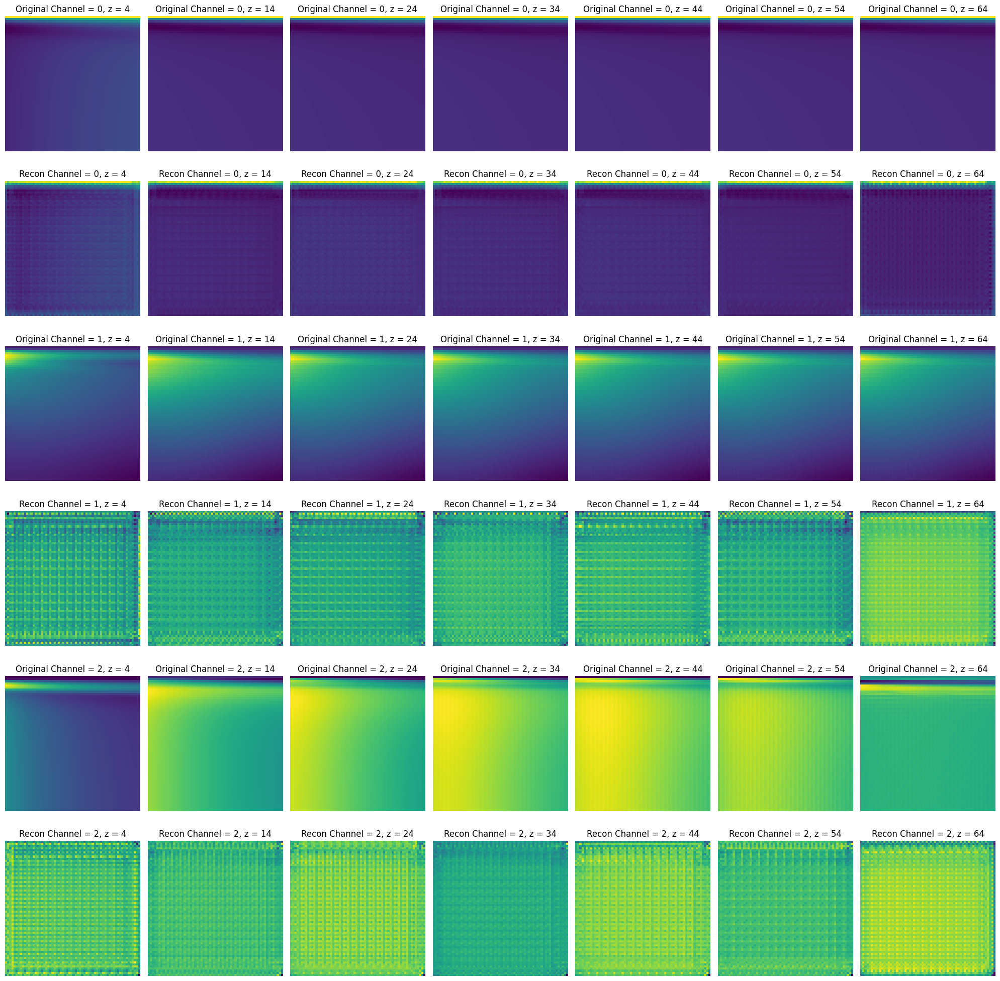

In [ ]:
def get_latent_representation(model, input_tensor):
    with torch.no_grad():  # Disable gradient computation
        model.eval()  # Set the model to evaluation mode
        latent_representation = model.encoder(input_tensor)
    return latent_representation

latent_representations = []
for batch in test_loader:
    input_tensor = batch[0].to(device)
    latent_representation = get_latent_representation(streets_overlapping_model, input_tensor)
    latent_representations.append(latent_representation)

latent_representations_tensor = torch.stack(latent_representations)
latent_representations_tensor.shape

original_data, reconstructed_data = reconstruct(streets_overlapping_model, test_loader, latent_repr=latent_representations_tensor)
print(original_data.shape, reconstructed_data.shape)
mse = F.mse_loss(reconstructed_data, original_data, reduction='mean').item()
print(f"Mean Squared Error on test data: {mse}")

visualize_recon(original_data, reconstructed_data.detach())

torch.Size([1, 3, 64, 256, 256]) torch.Size([1, 3, 64, 256, 256])


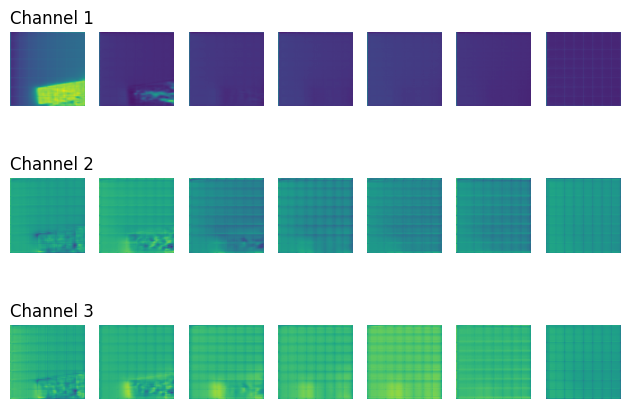

In [ ]:
# adapt to the input of reconstruct_full_data function
reconstructed_dataset = TensorDataset(reconstructed_data)
reconstructed_loader = DataLoader(reconstructed_dataset, batch_size=49)

reconstructed_full_data, count_array = reconstruct_full_data(reconstructed_loader, (1, 3, 64, 256, 256), block_size=64, overlap_ratio=(0.5, 0.5))
print(reconstructed_full_data.shape, count_array.shape)
visualize_data(reconstructed_full_data[0])

### Mode: pollution, Subdomain: Top Left

In [ ]:
data_256_1 = data_street[:,:,:,:256, :256]
data_256_1 = np.repeat(data_256_1, 3, axis=1)
data_street_downsampled_overlap_source = data_downsample_overlap(data_256_1, block_size=64, overlap_ratio=(0.5, 0.5))
print(data_street_downsampled_overlap_source.shape)

(490, 3, 64, 64, 64)


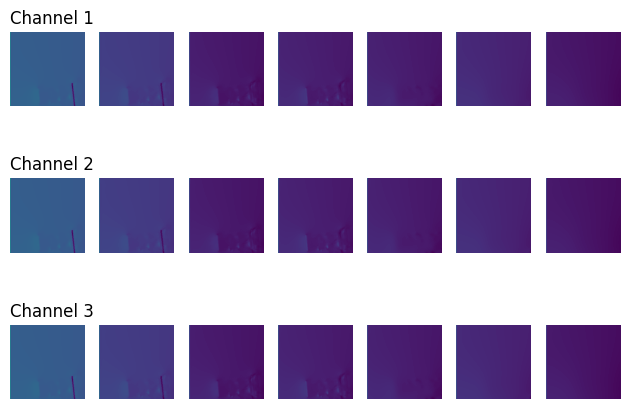

In [ ]:
visualize_data(data_256_1[9])

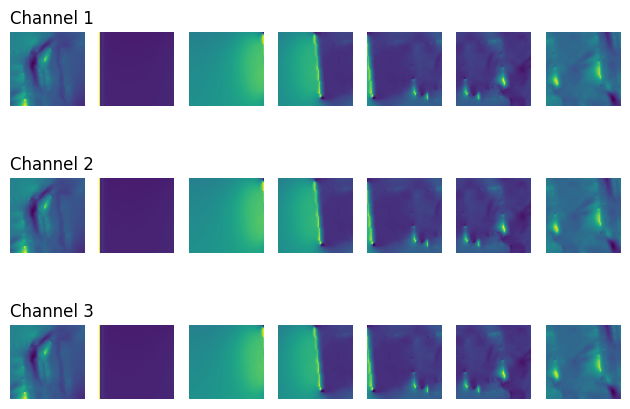

In [ ]:
show_overlapping(data_street_downsampled_overlap_source, np.arange(482, 489))

In [ ]:
# show the 1656th image is rotated
train_loader, val_loader, test_loader = split_data(data_street_downsampled_overlap_source, rotation=True)

before rotation: 
 [ 0.7510116   0.19487429 -0.01629907 -0.07027119 -0.06907421] ...
after rotation: 
 [0.06483233 0.06513715 0.06504631 0.06526589 0.06530643] ...
Train shape: (392, 3, 64, 64, 64),
Validation shape: (49, 3, 64, 64, 64), 
Test shape: (49, 3, 64, 64, 64)


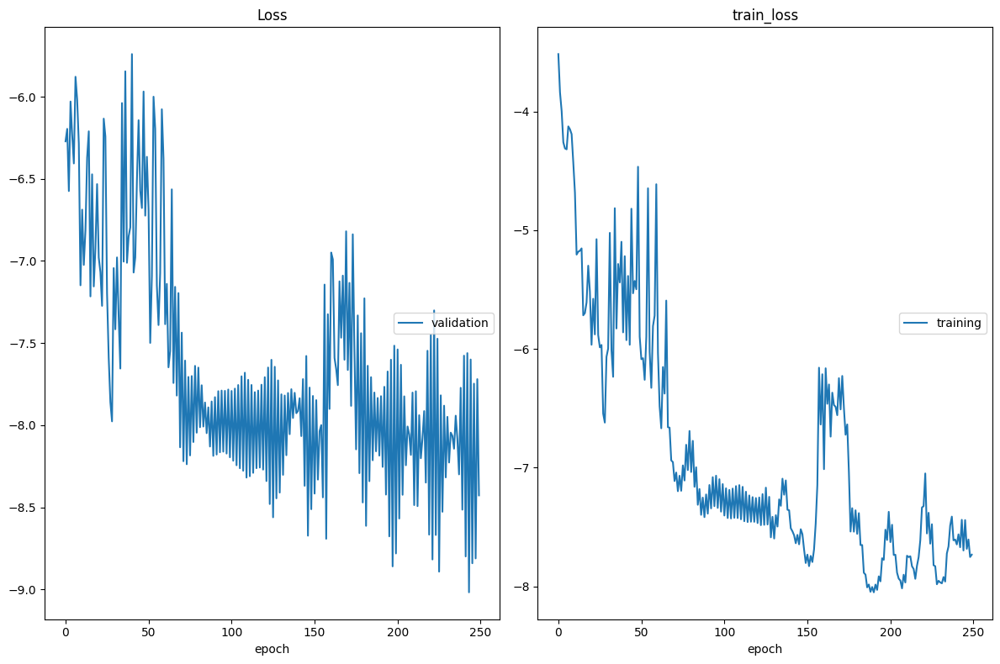

Loss
	validation       	 (min:   -9.017, max:   -5.741, cur:   -8.427)
train_loss
	training         	 (min:   -8.050, max:   -3.516, cur:   -7.732)
Epoch 250, Train Loss (log): 0.00043838775309268385, Val Loss (log): 0.0002189408623962663


In [ ]:
street_overlapping_model = Conv3DAutoencoder().to(device)
optimizer = optim.Adam(street_overlapping_model.parameters(), lr=1e-3, betas=(0.9, 0.999))
criterion = nn.MSELoss()

train_cvae(street_overlapping_model, optimizer, train_loader, num_epochs=500, val_loader=val_loader, adjust_batch=True)
torch.save(street_overlapping_model.state_dict(), '/content/gdrive/My Drive/pollution_topleft.pth')

In [ ]:
streets_overlapping_model = Conv3DAutoencoder().to(device)
streets_overlapping_model.load_state_dict(torch.load('/content/gdrive/My Drive/pollution_topleft.pth', map_location=device))

<All keys matched successfully>

torch.Size([49, 3, 64, 64, 64]) torch.Size([49, 3, 64, 64, 64])
Mean Squared Error on test data: 0.13158723711967468


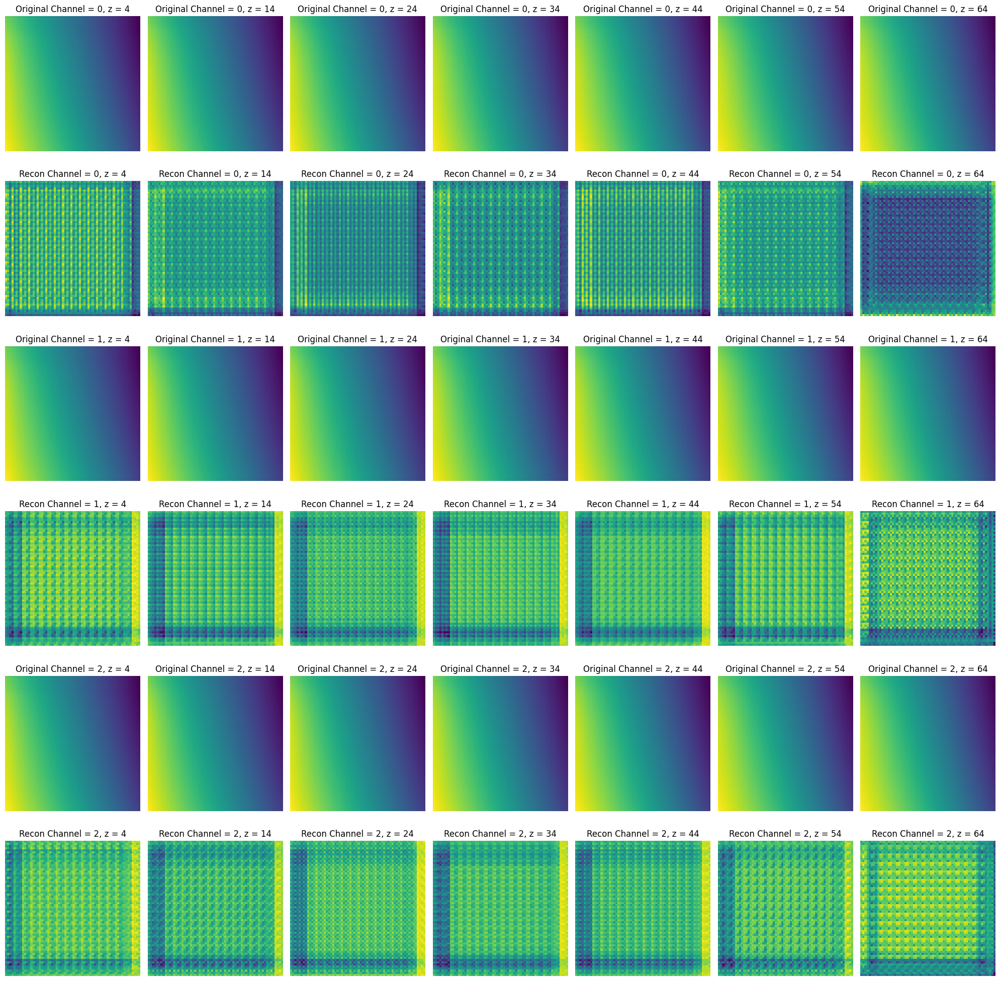

In [ ]:
def get_latent_representation(model, input_tensor):
    with torch.no_grad():  # Disable gradient computation
        model.eval()  # Set the model to evaluation mode
        latent_representation = model.encoder(input_tensor)
    return latent_representation

latent_representations = []
for batch in test_loader:
    input_tensor = batch[0].to(device)
    latent_representation = get_latent_representation(streets_overlapping_model, input_tensor)
    latent_representations.append(latent_representation)

latent_representations_tensor = torch.stack(latent_representations)
latent_representations_tensor.shape

original_data, reconstructed_data = reconstruct(streets_overlapping_model, test_loader, latent_repr=latent_representations_tensor)
print(original_data.shape, reconstructed_data.shape)
mse = F.mse_loss(reconstructed_data, original_data, reduction='mean').item()
print(f"Mean Squared Error on test data: {mse}")

visualize_recon(original_data, reconstructed_data.detach())

torch.Size([1, 3, 64, 256, 256]) torch.Size([1, 3, 64, 256, 256])


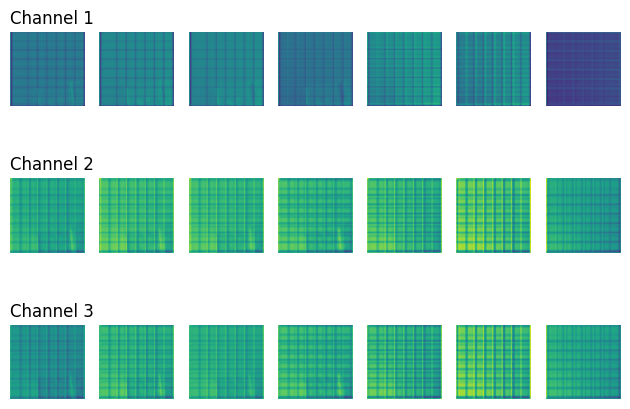

In [ ]:
# adapt to the input of reconstruct_full_data function
reconstructed_dataset = TensorDataset(reconstructed_data)
reconstructed_loader = DataLoader(reconstructed_dataset, batch_size=49)

reconstructed_full_data, count_array = reconstruct_full_data(reconstructed_loader, (1, 3, 64, 256, 256), block_size=64, overlap_ratio=(0.5, 0.5))
print(reconstructed_full_data.shape, count_array.shape)
visualize_data(reconstructed_full_data[0])

## Subdomain: Top Right

### Mode: pollution, Subdomain: Top Right

In [ ]:
data_256_2 = data_street[:,:,:,256:, :256]
data_256_2 = np.repeat(data_256_2, 3, axis=1)
data_street_downsampled_overlap_source = data_downsample_overlap(data_256_2, block_size=64, overlap_ratio=(0.5, 0.5))
print(data_street_downsampled_overlap_source.shape)

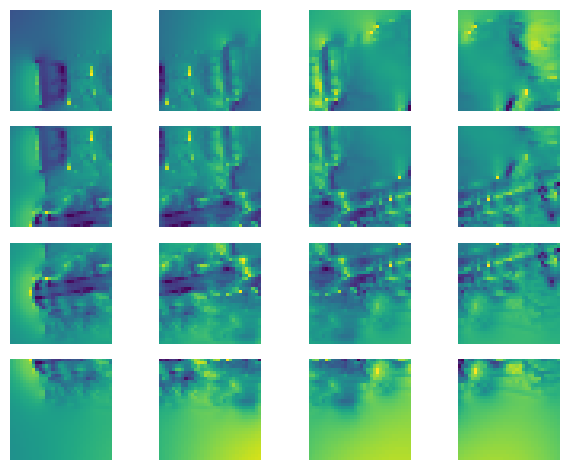

In [ ]:
show_overlapping_p(data_street_downsampled_overlap_source, start_index=64, z=4)

In [ ]:
train_loader, val_loader, test_loader = split_data(data_street_downsampled_overlap_source, rotation=True)

before rotation: 
 [-0.11881244  0.08850443  0.10090947  0.10296237  0.10365939] ...
after rotation: 
 [0.10645783 0.17901206 0.19176221 0.20007777 0.20757341] ...
Train shape: (392, 3, 64, 32, 32),
Validation shape: (49, 3, 64, 32, 32), 
Test shape: (49, 3, 64, 32, 32)


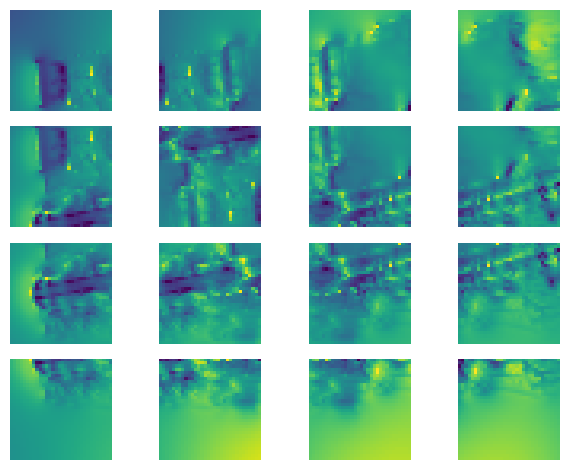

In [ ]:
show_overlapping_p(data_street_downsampled_overlap_source, start_index=64, z=4)

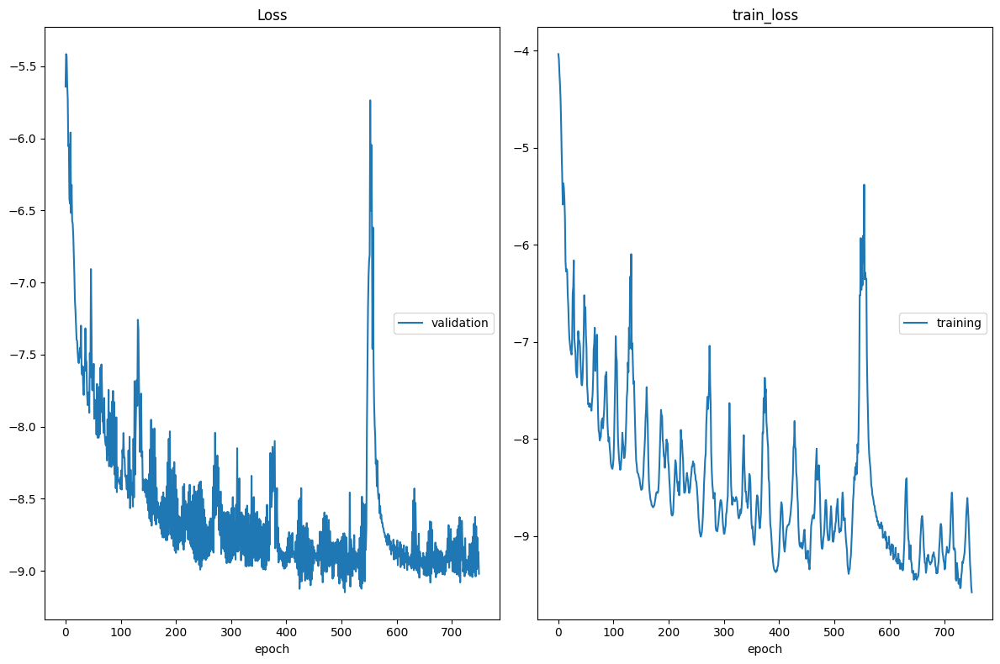

Loss
	validation       	 (min:   -9.149, max:   -5.415, cur:   -9.021)
train_loss
	training         	 (min:   -9.581, max:   -4.036, cur:   -9.581)
Epoch 750, Train Loss (log): 6.903468738528318e-05, Val Loss (log): 0.00012087897630408406


In [ ]:
streets_overlapping_model = Conv3DAutoencoder().to(device)
optimizer = optim.Adam(streets_overlapping_model.parameters(), lr=1e-3, betas=(0.9, 0.999))
criterion = nn.MSELoss()

train_cvae(streets_overlapping_model, optimizer, train_loader, num_epochs=750, val_loader=val_loader, adjust_batch=False)
torch.save(streets_overlapping_model.state_dict(), '/content/gdrive/My Drive/pollution_topright.pth')

### Mode: velocity, Subdomain: Top Right

In [ ]:
data_256_2 = data_street[:,:,:,256:, :256]
data_street_downsampled_overlap = data_downsample_overlap(data_256_2, block_size=64, overlap_ratio=(0.5, 0.5))
print(data_street_downsampled_overlap.shape)

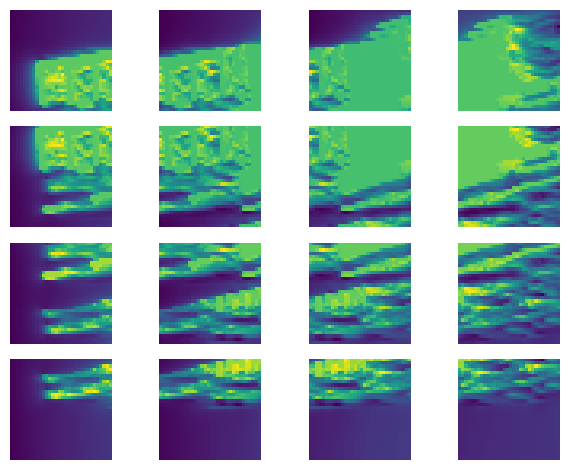

In [ ]:
show_overlapping_p(data_street_downsampled_overlap, start_index=64, z=4)

In [ ]:
train_loader, val_loader, test_loader = split_data(resized_data_128_v_preprocessed, rotation=True)

before rotation: 
 [0.23933876 0.23933876 0.23933876 0.23933876 0.23933876] ...
after rotation: 
 [ 0.23933876 -0.3433447  -0.48991108 -0.47117084 -0.4542488 ] ...
Train shape: (392, 3, 64, 32, 32),
Validation shape: (49, 3, 64, 32, 32), 
Test shape: (49, 3, 64, 32, 32)


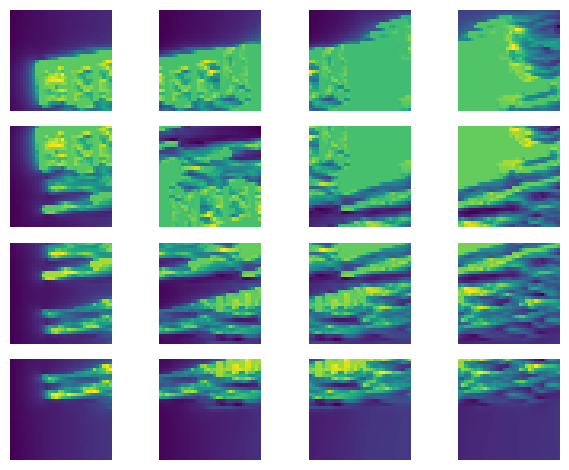

In [ ]:
show_overlapping_p(data_street_downsampled_overlap, start_index=64, z=4)

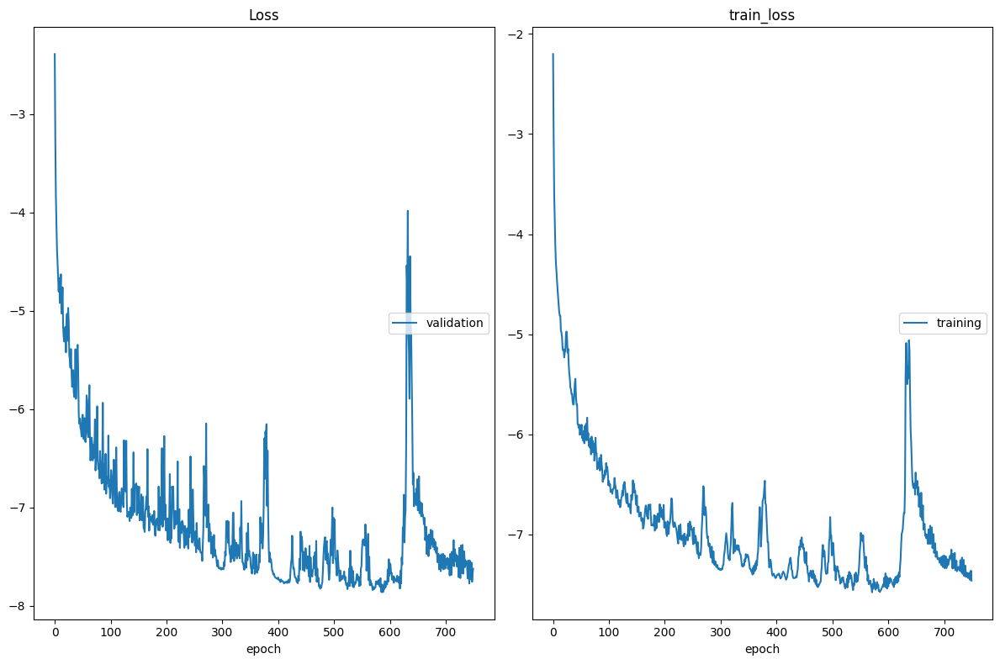

Loss
	validation       	 (min:   -7.863, max:   -2.392, cur:   -7.623)
train_loss
	training         	 (min:   -7.577, max:   -2.202, cur:   -7.460)
Epoch 750, Train Loss (log): 0.0005756798018410336, Val Loss (log): 0.0004890456330031157


In [ ]:
streets_overlapping_model = Conv3DAutoencoder().to(device)
optimizer = optim.Adam(streets_overlapping_model.parameters(), lr=1e-3, betas=(0.9, 0.999))
criterion = nn.MSELoss()

train_cvae(streets_overlapping_model, optimizer, train_loader, num_epochs=750, val_loader=val_loader, adjust_batch=False)
torch.save(streets_overlapping_model.state_dict(), '/content/gdrive/My Drive/Urban_street_model_v_128.pth')

## Subdomain: Bottom Right

### Mode: velocity, Subdomain: Bottom Right

In [ ]:
data_256_4 = data_street[:,:,:,256:, 256:]
data_street_downsampled_overlap = data_downsample_overlap(data_256_4, block_size=64, overlap_ratio=(0.5, 0.5))
print(data_street_downsampled_overlap.shape)

(180, 3, 64, 32, 32)


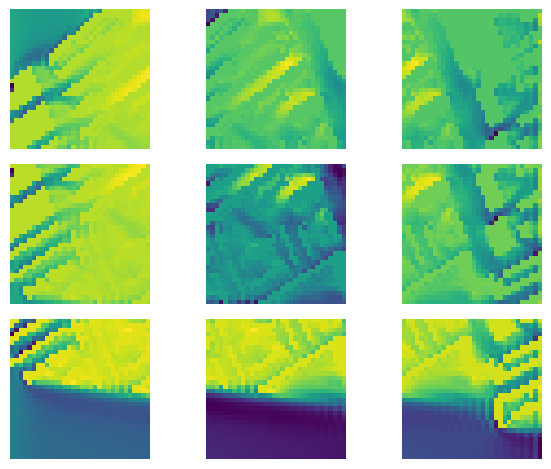

In [ ]:
show_overlapping(data_streets_downsampled_overlap)

In [ ]:
train_loader, val_loader, test_loader = split_data(data_streets_downsampled_overlap, rotation=True)

before rotation: 
 [-0.1239906  -0.13070476 -0.14172345 -0.15385872 -0.16764742] ...
after rotation: 
 [0.4245218  0.45228052 0.4322325  0.3396883  0.29928792] ...
Train shape: (144, 3, 64, 32, 32),
Validation shape: (18, 3, 64, 32, 32), 
Test shape: (18, 3, 64, 32, 32)


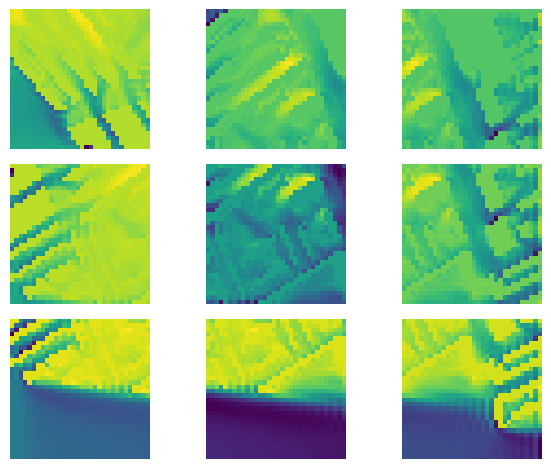

In [ ]:
show_overlapping(data_streets_downsampled_overlap)

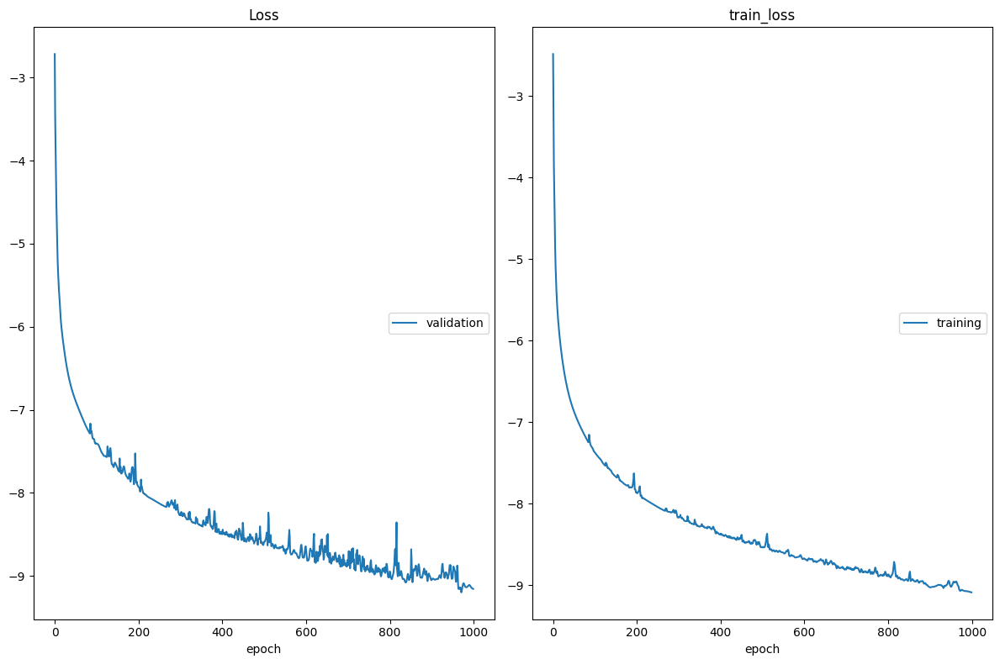

Loss
	validation       	 (min:   -9.199, max:   -2.715, cur:   -9.158)
train_loss
	training         	 (min:   -9.087, max:   -2.487, cur:   -9.087)
Epoch 1000, Train Loss (log): 0.00011317545310400116, Val Loss (log): 0.0001053371379384771


In [ ]:
streets_overlapping_model = Conv3DAutoencoder().to(device)
optimizer = optim.Adam(streets_overlapping_model.parameters(), lr=1e-3, betas=(0.9, 0.999))
criterion = nn.MSELoss()

train_cvae(streets_overlapping_model, optimizer, train_loader, num_epochs=1000, val_loader=val_loader, adjust_batch=False)
torch.save(streets_overlapping_model.state_dict(), '/content/gdrive/My Drive/streets_overlapping_model_1000.pth')

In [ ]:
streets_overlapping_model = Conv3DAutoencoder().to(device)
streets_overlapping_model.load_state_dict(torch.load('/content/gdrive/My Drive/streets_overlapping_model_1000.pth', map_location=device))

<All keys matched successfully>

In [ ]:
def get_latent_representation(model, input_tensor):
    with torch.no_grad():  # Disable gradient computation
        model.eval()  # Set the model to evaluation mode
        latent_representation = model.encoder(input_tensor)
    return latent_representation

latent_representations = []  # [9, 25, 64, 8, 16, 16]
for batch in test_loader:
    input_tensor = batch[0].to(device)
    latent_representation = get_latent_representation(streets_overlapping_model, input_tensor)
    latent_representations.append(latent_representation)

latent_representations_tensor = torch.stack(latent_representations)
latent_representations_tensor.shape

torch.Size([1, 18, 64, 8, 8, 8])

In [ ]:
original_data, reconstructed_data = reconstruct(streets_overlapping_model, test_loader, latent_repr=latent_representations_tensor)
print(original_data.shape, reconstructed_data.shape)
mse = F.mse_loss(reconstructed_data, original_data, reduction='mean').item()
print(f"Mean Squared Error on test data: {mse}")

torch.Size([18, 3, 64, 32, 32]) torch.Size([18, 3, 64, 32, 32])
Mean Squared Error on test data: 0.00010533788008615375


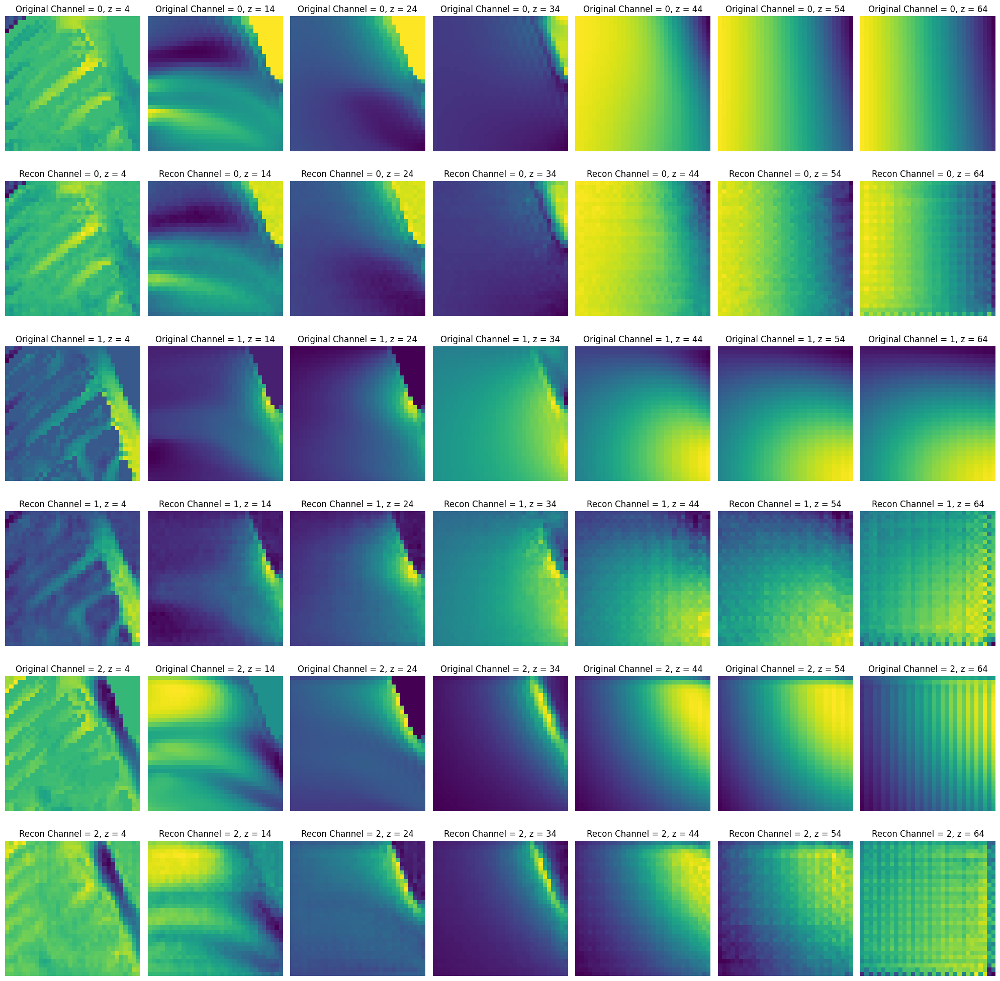

In [ ]:
visualize_recon(original_data, reconstructed_data.detach())

In [ ]:
# adapt to the input of reconstruct_full_data function
reconstructed_dataset = TensorDataset(reconstructed_data)
reconstructed_loader = DataLoader(reconstructed_dataset, batch_size=25)

torch.Size([2, 3, 64, 64, 64]) torch.Size([2, 3, 64, 64, 64])


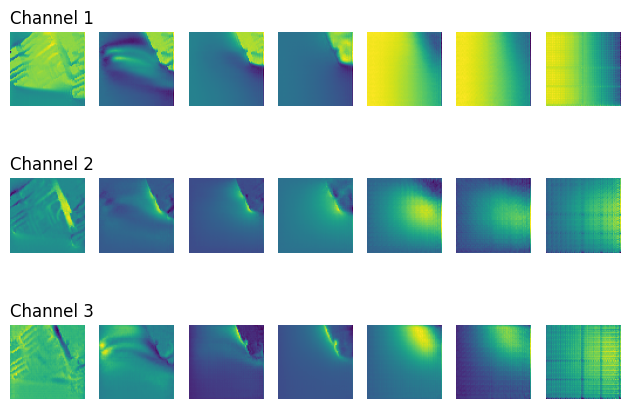

In [ ]:
reconstructed_full_data, count_array = reconstruct_full_data(reconstructed_loader, (2, 3, 64, 64, 64), block_size=32, overlap_ratio=(0.5, 0.5))
print(reconstructed_full_data.shape, count_array.shape)
visualize_data(reconstructed_full_data[0])

### Mode: pollution, Subdomain: Bottom Right

In [ ]:
data_256_4 = data_street[:,:,:,256:, 256:]
data_256_4 = np.repeat(data_256_4, 3, axis=1)
data_street_downsampled_overlap_source = data_downsample_overlap(data_256_2, block_size=64, overlap_ratio=(0.5, 0.5))
print(data_street_downsampled_overlap_source.shape)

(180, 3, 64, 32, 32)


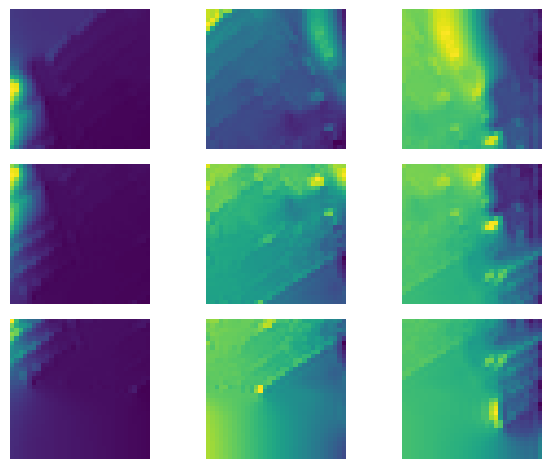

In [ ]:
show_overlapping(data_streets_downsampled_overlap_source)

In [ ]:
train_loader, val_loader, test_loader = split_data(data_streets_downsampled_overlap_source, rotation=True)

before rotation: 
 [-0.3440768  -0.34941047 -0.35692286 -0.36391604 -0.36912823] ...
after rotation: 
 [-0.54059243 -0.5397114  -0.5431355  -0.5441929  -0.54283476] ...
Train shape: (144, 3, 64, 32, 32),
Validation shape: (18, 3, 64, 32, 32), 
Test shape: (18, 3, 64, 32, 32)


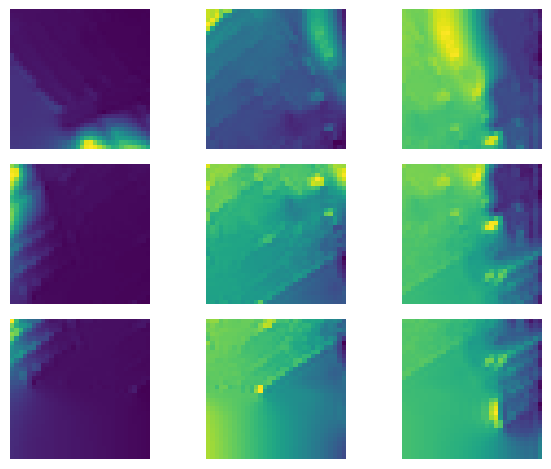

In [ ]:
show_overlapping(data_streets_downsampled_overlap_source)

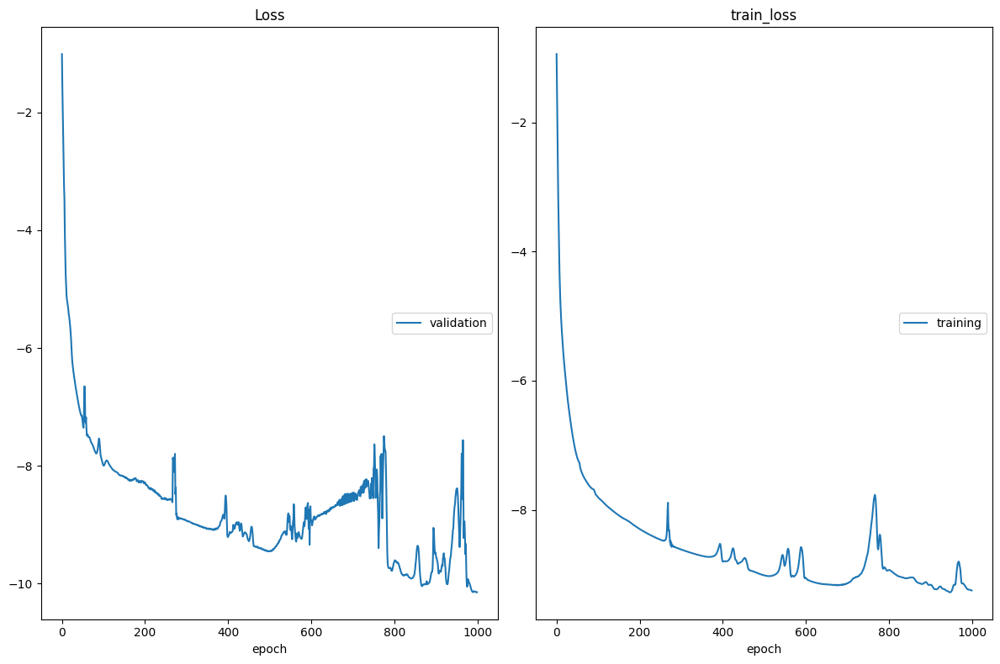

Loss
	validation       	 (min:  -10.146, max:   -1.013, cur:  -10.144)
train_loss
	training         	 (min:   -9.279, max:   -0.940, cur:   -9.250)
Epoch 1000, Train Loss (log): 9.610231002928533e-05, Val Loss (log): 3.9308652048930526e-05


In [ ]:
streets_overlapping_model = Conv3DAutoencoder().to(device)
optimizer = optim.Adam(streets_overlapping_model.parameters(), lr=1e-3, betas=(0.9, 0.999))
criterion = nn.MSELoss()

train_cvae(streets_overlapping_model, optimizer, train_loader, num_epochs=1000, val_loader=val_loader, adjust_batch=False)
torch.save(streets_overlapping_model.state_dict(), '/content/gdrive/My Drive/pollution_bottomright.pth')

In [ ]:
streets_overlapping_model = Conv3DAutoencoder().to(device)
streets_overlapping_model.load_state_dict(torch.load('/content/gdrive/My Drive/pollution_bottomright.pth', map_location=device))

<All keys matched successfully>

In [ ]:
def get_latent_representation(model, input_tensor):
    with torch.no_grad():  # Disable gradient computation
        model.eval()  # Set the model to evaluation mode
        latent_representation = model.encoder(input_tensor)
    return latent_representation

latent_representations = []  # [9, 25, 64, 8, 16, 16]
for batch in test_loader:
    input_tensor = batch[0].to(device)
    latent_representation = get_latent_representation(streets_overlapping_model, input_tensor)
    latent_representations.append(latent_representation)

latent_representations_tensor = torch.stack(latent_representations)
latent_representations_tensor.shape

torch.Size([1, 18, 64, 8, 8, 8])

In [ ]:
original_data, reconstructed_data = reconstruct(streets_overlapping_model, test_loader, latent_repr=latent_representations_tensor)
print(original_data.shape, reconstructed_data.shape)
mse = F.mse_loss(reconstructed_data, original_data, reduction='mean').item()
print(f"Mean Squared Error on test data: {mse}")

torch.Size([18, 3, 64, 32, 32]) torch.Size([18, 3, 64, 32, 32])
Mean Squared Error on test data: 3.9308852137764916e-05


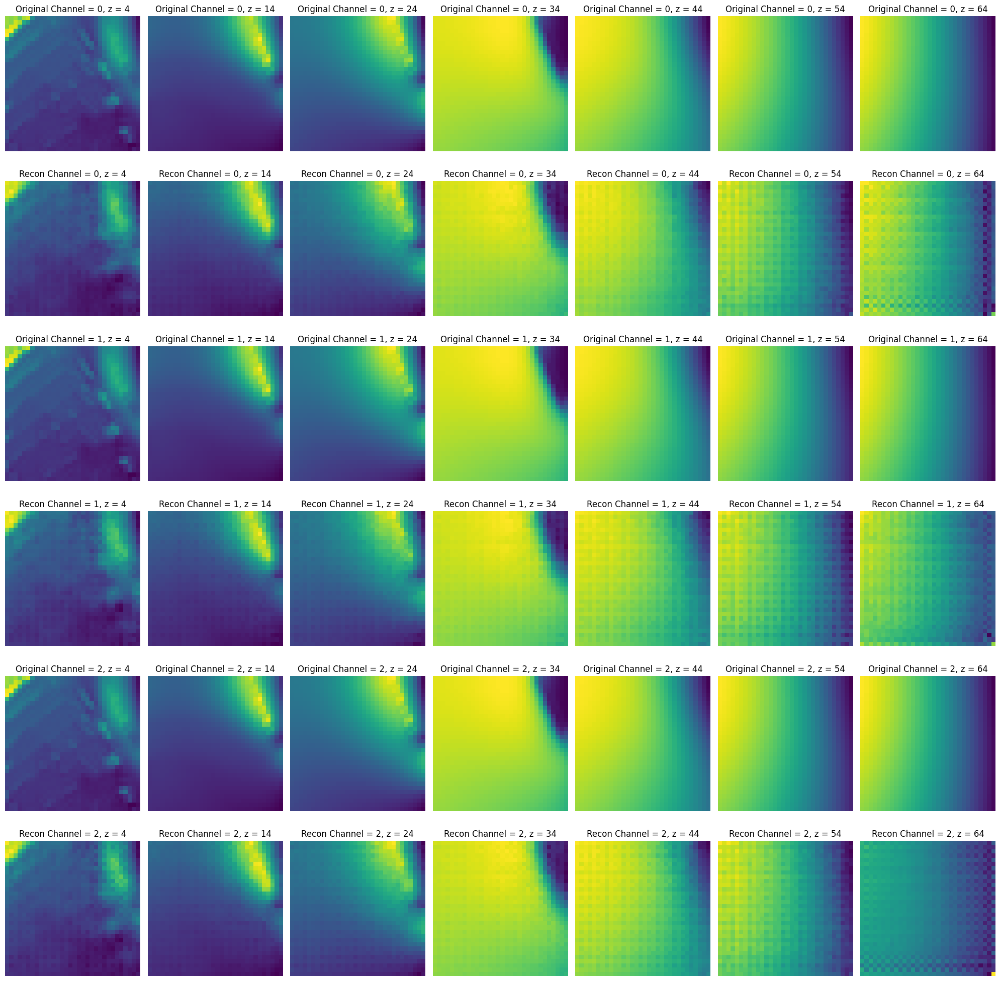

In [ ]:
visualize_recon(original_data, reconstructed_data.detach())

torch.Size([2, 3, 64, 64, 64]) torch.Size([2, 3, 64, 64, 64])


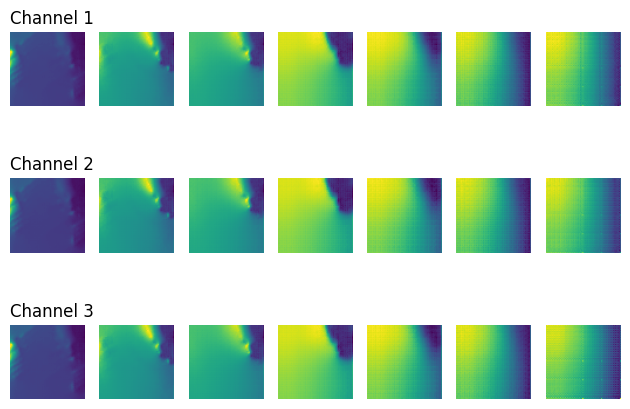

In [ ]:
# adapt to the input of reconstruct_full_data function
reconstructed_dataset = TensorDataset(reconstructed_data)
reconstructed_loader = DataLoader(reconstructed_dataset, batch_size=25)

reconstructed_full_data, count_array = reconstruct_full_data(reconstructed_loader, (2, 3, 64, 64, 64), block_size=32, overlap_ratio=(0.5, 0.5))
print(reconstructed_full_data.shape, count_array.shape)
visualize_data(reconstructed_full_data[0])

## Subdomain: Bottom Left

### Mode: pollution, Subdomain: Bottom Left

In [ ]:
data_256_3 = np.repeat(data_256_3, 3, axis=1)
data_street_downsampled_overlap_source = data_downsample_overlap(data_256_3, block_size=64, overlap_ratio=(0.5, 0.5))
print(data_street_downsampled_overlap_source.shape)

(490, 3, 64, 64, 64)


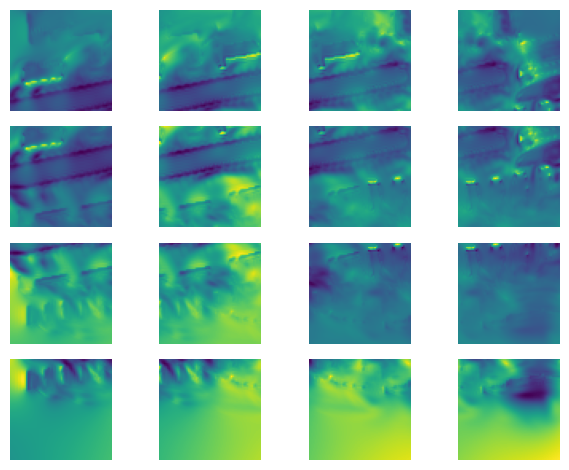

In [ ]:
show_overlapping_p(data_street_downsampled_overlap_source, start_index=52, z=4)

In [ ]:
train_loader, val_loader, test_loader = split_data(data_street_downsampled_overlap_source, rotation=True)

before rotation: 
 [0.3892268  0.01175058 0.06503522 0.05687737 0.05084956] ...
after rotation: 
 [0.13680935 0.1368804  0.13696027 0.13704896 0.13714719] ...
Train shape: (392, 3, 64, 64, 64),
Validation shape: (49, 3, 64, 64, 64), 
Test shape: (49, 3, 64, 64, 64)


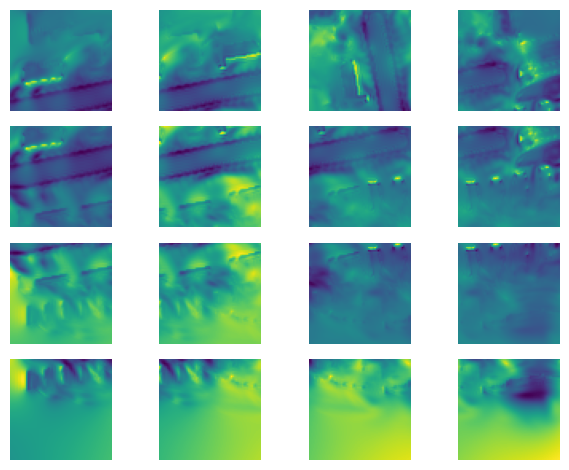

In [ ]:
show_overlapping_p(data_street_downsampled_overlap_source, start_index=52, z=4)

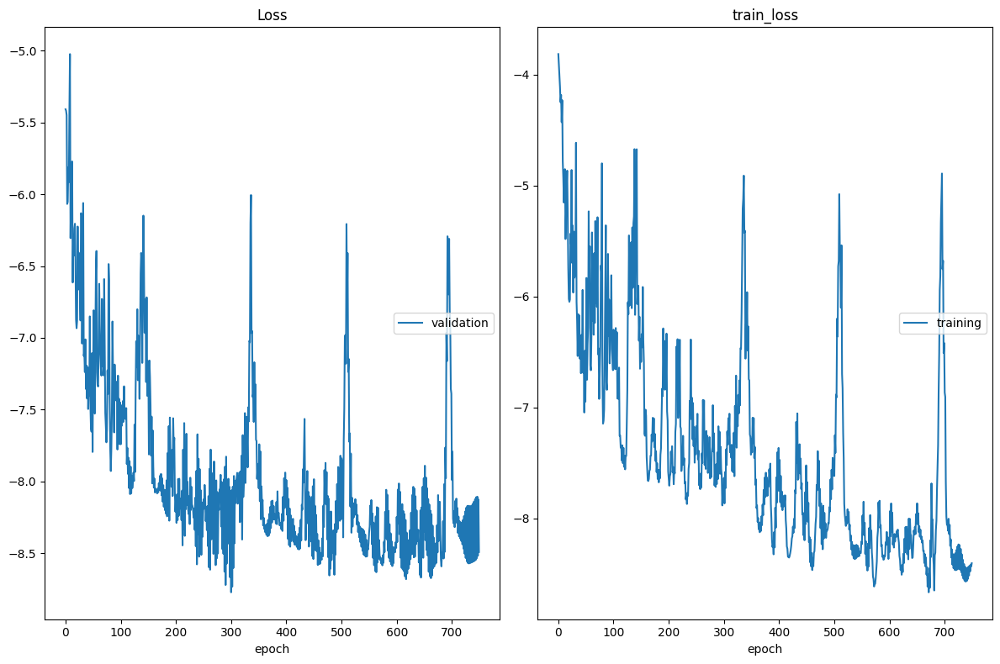

Loss
	validation       	 (min:   -8.771, max:   -5.024, cur:   -8.490)
train_loss
	training         	 (min:   -8.668, max:   -3.815, cur:   -8.406)
Epoch 750, Train Loss (log): 0.00022351538609655108, Val Loss (log): 0.0002054364995274227


In [ ]:
street_overlapping_model = Conv3DAutoencoder().to(device)
optimizer = optim.Adam(street_overlapping_model.parameters(), lr=1e-3, betas=(0.9, 0.999))
criterion = nn.MSELoss()

train_cvae(street_overlapping_model, optimizer, train_loader, num_epochs=750, val_loader=val_loader, adjust_batch=True)
torch.save(street_overlapping_model.state_dict(), '/content/gdrive/My Drive/pollution_bottomleft.pth')

### Mode: velocity, Subdomain: Bottom Left

In [ ]:
data_256_3 = data_street[:,:,:, :256, 256:]
data_256_3 = np.repeat(data_256_3, 3, axis=1)
data_street_downsampled_overlap_source = data_downsample_overlap(data_256_3, block_size=64, overlap_ratio=(0.5, 0.5))
print(data_street_downsampled_overlap.shape)

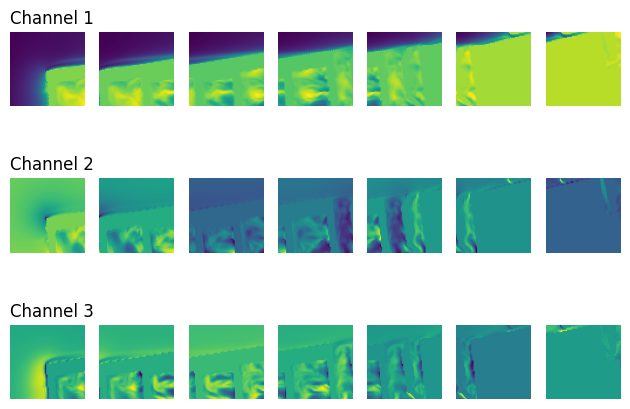

In [ ]:
show_overlapping_p(data_street_downsampled_overlap, start_index=52, z=4)

**2. Rotation**

In [ ]:
train_loader, val_loader, test_loader = split_data(data_street_downsampled_overlap, rotation=True)

before rotation: 
 [-0.3269055  -0.3252737  -0.32417446 -0.32246196 -0.32140607] ...
after rotation: 
 [0.02973676 0.07704949 0.1584537  0.20512235 0.41430128] ...
Train shape: (1800, 3, 64, 64, 64),
Validation shape: (225, 3, 64, 64, 64), 
Test shape: (225, 3, 64, 64, 64)


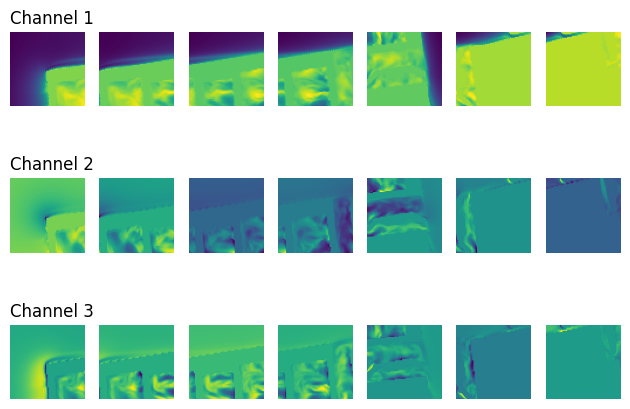

In [ ]:
show_overlapping_p(data_street_downsampled_overlap, start_index=52, z=4)

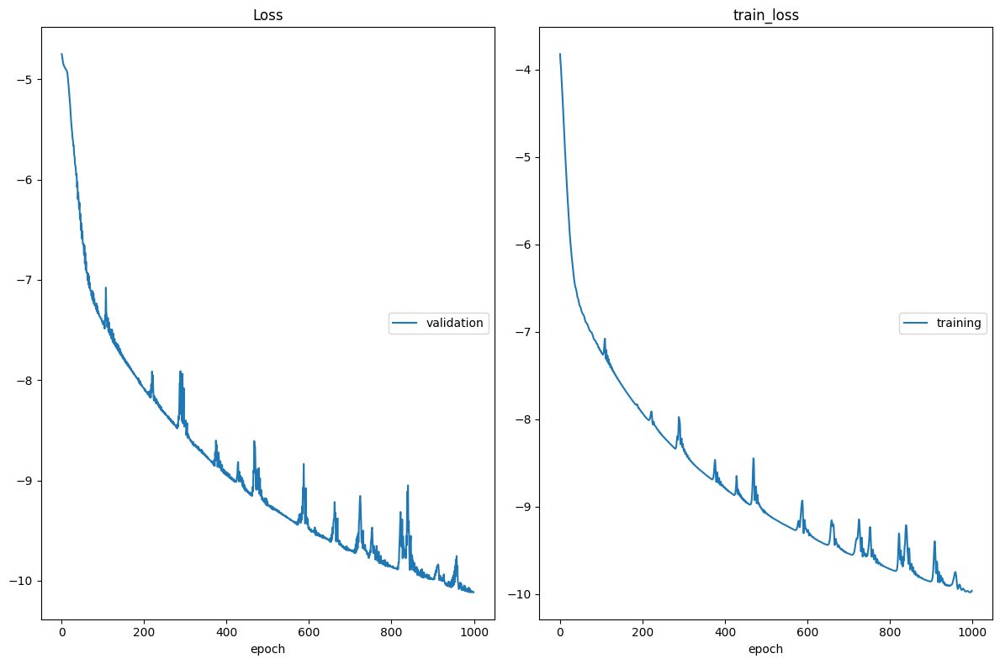

Loss
	validation       	 (min:  -10.115, max:   -4.749, cur:  -10.115)
train_loss
	training         	 (min:   -9.979, max:   -3.826, cur:   -9.960)
Epoch 1000, Train Loss (log): 4.725266990135424e-05, Val Loss (log): 4.046977119287476e-05


In [ ]:
street_overlapping_model = Conv3DAutoencoder().to(device)
optimizer = optim.Adam(street_overlapping_model.parameters(), lr=1e-3, betas=(0.9, 0.999))
criterion = nn.MSELoss()

train_cvae(street_overlapping_model, optimizer, train_loader, num_epochs=1000, val_loader=val_loader, adjust_batch=False)
torch.save(street_overlapping_model.state_dict(), '/content/gdrive/My Drive/velocity_bottomleft.pth')

# Test Case: South Kensington (64, 512, 512)

### data

(1, 1280, 1280, 128, 1) torch.Size([1, 1, 64, 512, 512])


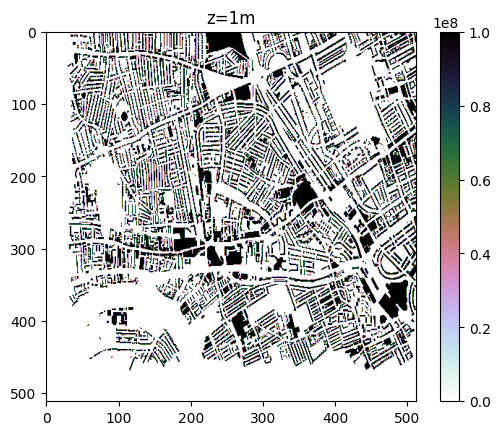

In [51]:
# Numerial parameters
nx, ny, nz = 512, 512, 64
input_shape = (1,1,nz,ny,nx)

mesh = np.load("/content/gdrive/My Drive/IRP/INHALE_1280.npy")
sigma = torch.zeros(input_shape, dtype=torch.float32, device=device)
print(mesh.shape, sigma.shape)
for i in range(nz):
    sigma[0,0,i,:,:] = torch.tensor(mesh[0,180:692,240:752,i,0])
sigma = sigma.transpose_(4, 3)
sigma = torch.flip(sigma, [3])
sigma = torch.where(sigma == 0, torch.tensor(1e08, dtype=torch.float32, device=device), torch.tensor(0, dtype=torch.float32, device=device))
sigma[0, 0, 1, 75:125, 400:450] = torch.tensor(5e07, dtype=torch.float32, device=device)
create_zigzag_pattern(sigma, start_row=375, end_row=425, start_col=150, end_col=200, z_index=1, value=5e07, slope_row=1, slope_col=1, thickness=10, device=device)

plt.imshow(sigma[0,0,1,:,:].cpu(), cmap='cubehelix_r')  # the third parameter is the z
plt.title("z=1m")
plt.colorbar()

(3, 64, 512, 512)


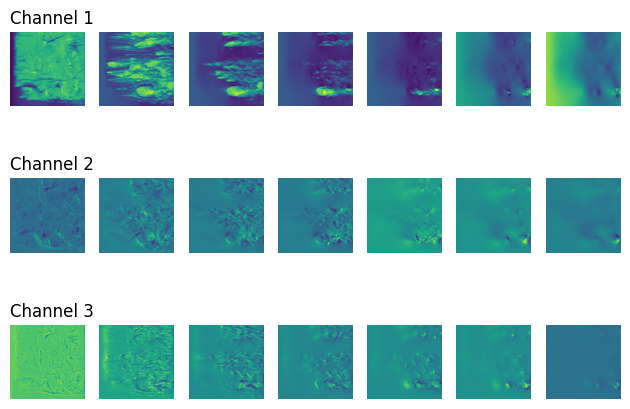

In [ ]:
data_southken_10000 = np.load("/content/gdrive/My Drive/IRP/Urban_data_L_small/combined_data_10000.npy")
data_southken_10000 = normalization(data_southken_10000)
print(data_southken_10000.shape)
visualize_data(data_southken_10000)

### overlapping

In [ ]:
# data_southken_downsampled_overlap = data_downsample_overlap(data_southken, block_size=64, overlap_ratio=(0.5, 0.5))
# np.save('/content/gdrive/My Drive/IRP/Urban_data_L_small/Urban_data_L_small/data_southken_downsampled_overlap.npy', data_southken_downsampled_overlap)

data_southken_downsampled_overlap = np.load('/content/gdrive/My Drive/IRP/Urban_data_L_small/Urban_data_L_small/data_southken_downsampled_overlap.npy')
print(data_southken_downsampled_overlap.shape)

(2250, 3, 64, 64, 64)


In [ ]:
# dataset_southken = TensorDataset(torch.from_numpy(data_southken_downsampled_overlap))
# data_loader_southken = DataLoader(dataset_southken, batch_size=225, shuffle=False)
# print("Data shape: ", data_southken_downsampled_overlap.shape)

train_loader, val_loader, test_loader = split_data(data_southken_downsampled_overlap)

Train shape: (1800, 3, 64, 64, 64),
Validation shape: (225, 3, 64, 64, 64), 
Test shape: (225, 3, 64, 64, 64)


In [ ]:
next(iter(test_loader))[0].shape

torch.Size([25, 3, 64, 64, 64])

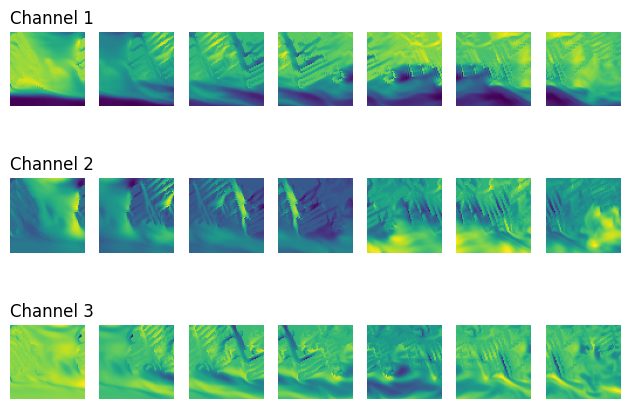

In [ ]:
# Show the overlapping effect

indices = np.arange(2000, 2007)  # sequential images
channel_titles = ['Channel 1', 'Channel 2', 'Channel 3']

fig, axes = plt.subplots(3, 7)
for row in range(3):
    for col, idx in enumerate(indices):
        ax = axes[row, col]
        ax.imshow(data_southken_downsampled_overlap[idx][row, 4].squeeze())
        ax.axis('off')

        # Add title to the first column of each row
        if col == 0:
            ax.set_title(channel_titles[row], loc='left', fontsize=12)

plt.tight_layout()
plt.show()

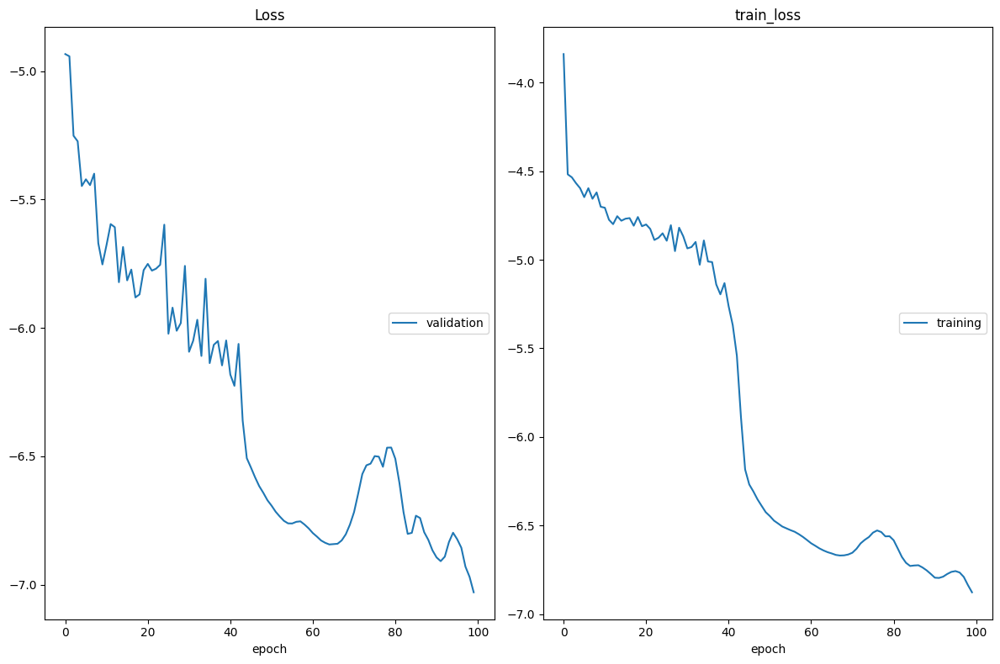

Loss
	validation       	 (min:   -7.030, max:   -4.934, cur:   -7.030)
train_loss
	training         	 (min:   -6.877, max:   -3.839, cur:   -6.877)
Epoch 100, Train Loss (log): 0.001031248218269967, Val Loss (log): 0.0008851065843676528


In [ ]:
southken_overlapping_model = Conv3DAutoencoder().to(device)
optimizer = optim.Adam(southken_overlapping_model.parameters(), lr=1e-3, betas=(0.9, 0.999))
criterion = nn.MSELoss()

train_cvae(southken_overlapping_model, optimizer, train_loader, num_epochs=100, val_loader=val_loader, adjust_batch=False)
torch.save(southken_overlapping_model.state_dict(), '/content/gdrive/My Drive/southken_overlapping_model_100.pth')

In [ ]:
southken_overlapping_model = Conv3DAutoencoder().to(device)
southken_overlapping_model.load_state_dict(torch.load('/content/gdrive/My Drive/southken_overlapping_model_100.pth'))

<All keys matched successfully>

In [ ]:
original_data, reconstructed_data = reconstruct(southken_overlapping_model, test_loader)
print(original_data.shape, reconstructed_data.shape)
mse = F.mse_loss(reconstructed_data, original_data, reduction='mean').item()
print(f"Mean Squared Error on test data: {mse}")

torch.Size([225, 3, 64, 64, 64]) torch.Size([225, 3, 64, 64, 64])
Mean Squared Error on test data: 0.0006829541525803506


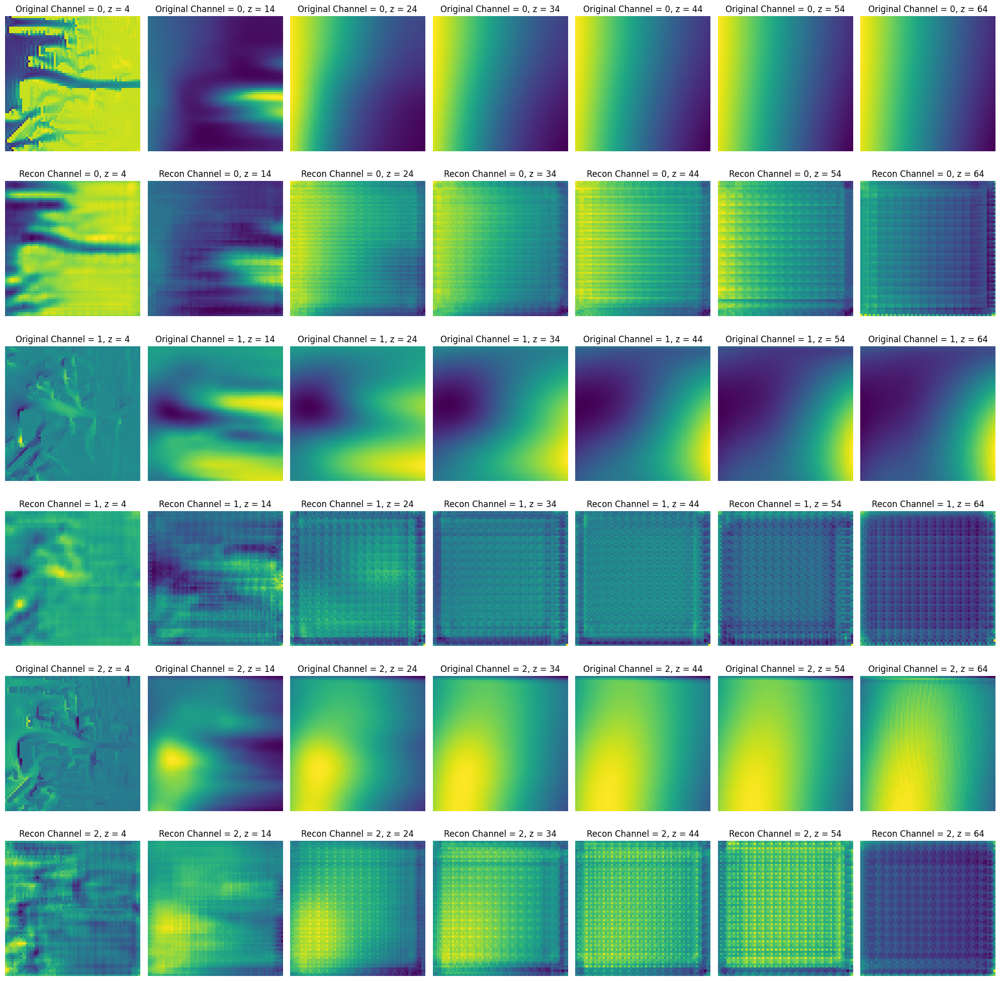

In [ ]:
visualize_recon(original_data, reconstructed_data)

In [ ]:
# adapt to the input of reconstruct_full_data function
reconstructed_dataset = TensorDataset(reconstructed_data)
reconstructed_loader = DataLoader(reconstructed_dataset, batch_size=25)

(1, 3, 64, 512, 512) (1, 3, 64, 512, 512)


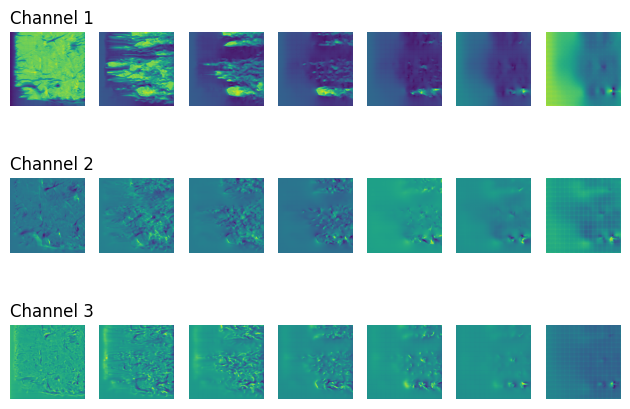

In [ ]:
# reconstructed images
reconstructed_full_data, count_array = reconstruct_full_data(reconstructed_loader, (1, 3, 64, 512, 512), block_size=64, overlap_ratio=(0.5, 0.5))
print(reconstructed_full_data.shape, count_array.shape)
visualize_data(reconstructed_full_data[0])

(1, 3, 64, 512, 512) (1, 3, 64, 512, 512)


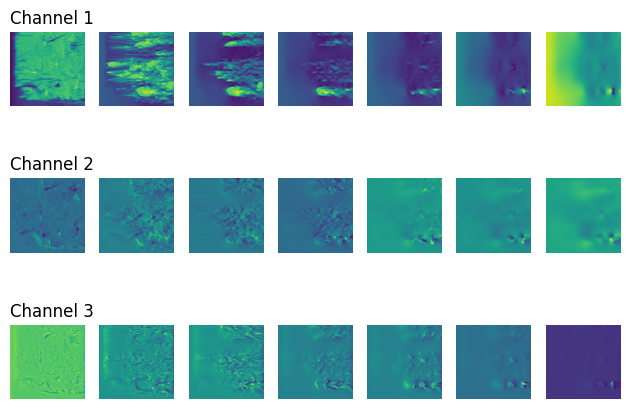

In [ ]:
# original test_loader

reconstructed_data, count_array = reconstruct_full_data(test_loader, (1, 3, 64, 512, 512), block_size=64, overlap_ratio=(0.5, 0.5))
print(reconstructed_data.shape, count_array.shape)
visualize_data(reconstructed_data[0])

# Final Result Visualisation

(1, 512, 512, 64, 1) torch.Size([1, 1, 64, 512, 512])


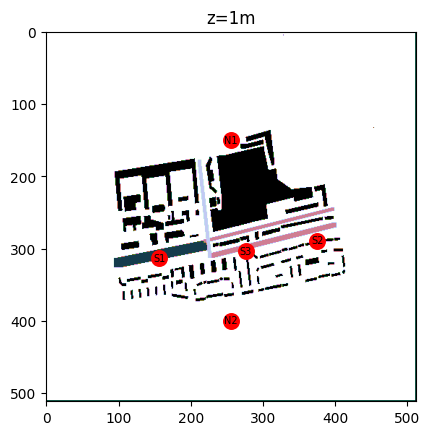

In [141]:
# Numerial parameters
nx, ny, nz = 512, 512, 64
input_shape = (1,1,nz,ny,nx)

# Sensor positions (From Zhan Xuan)
x_coords = [156, 276, 375, 255, 255]
y_coords = [313, 304, 289, 150, 400]
labels = ['S1', 'S3', 'S2', 'N1', 'N2']

mesh = np.load("/content/gdrive/My Drive/IRP/Urban_street.npy")
sigma = torch.zeros(input_shape, dtype=torch.float32, device=device)
print(mesh.shape, sigma.shape)
for i in range(nz):
    sigma[0,0,i,:,:] = torch.tensor(mesh[0,:,:,i,0])
sigma = sigma.transpose_(4, 3)
sigma = torch.flip(sigma, [3])
sigma = torch.where(sigma == 0, torch.tensor(1e08, dtype=torch.float32, device=device), torch.tensor(0, dtype=torch.float32, device=device))

# Constant Pollution Source Demonstration (not the actual value)
# z=1 horizontal
create_zigzag_pattern(sigma, start_row=320, end_row=350, start_col=100, end_col=225, z_index=1, value=8e07, slope_row=-1, slope_col=5, thickness=6, device=device)
create_zigzag_pattern(sigma, start_row=290, end_row=350, start_col=220, end_col=400, z_index=1, value=4e07, slope_row=-1, slope_col=4, thickness=2, device=device)
create_zigzag_pattern(sigma, start_row=310, end_row=350, start_col=230, end_col=400, z_index=1, value=4e07, slope_row=-1, slope_col=4, thickness=3, device=device)

# z=1 vertical
create_zigzag_pattern(sigma, start_row=180, end_row=310, start_col=212, end_col=380, z_index=1, value=2e07, slope_row=9, slope_col=1, thickness=2, device=device)
create_zigzag_pattern(sigma, start_row=185, end_row=315, start_col=212, end_col=380, z_index=1, value=2e07, slope_row=9, slope_col=1, thickness=2, device=device)

plt.imshow(sigma[0,0,1,:,:].cpu(), cmap='cubehelix_r')

plt.title("z=1m")
# plt.colorbar()

plt.scatter(x_coords, y_coords, color='red', marker='o', s=125)
for i, label in enumerate(labels):
    plt.text(x_coords[i], y_coords[i], label, fontsize=7, ha='center', va='center', color='black')

### Data Assimilation Result

In [ ]:
data = np.load("/content/gdrive/My Drive/IRP/Urban_street/final_combined_data.npy")
data_p_original = np.load("/content/gdrive/My Drive/IRP/Urban_street/final_combined_data_p.npy")
data_p = np.load("/content/gdrive/My Drive/IRP/Urban_street_source/data/final_combined_data_p.npy")

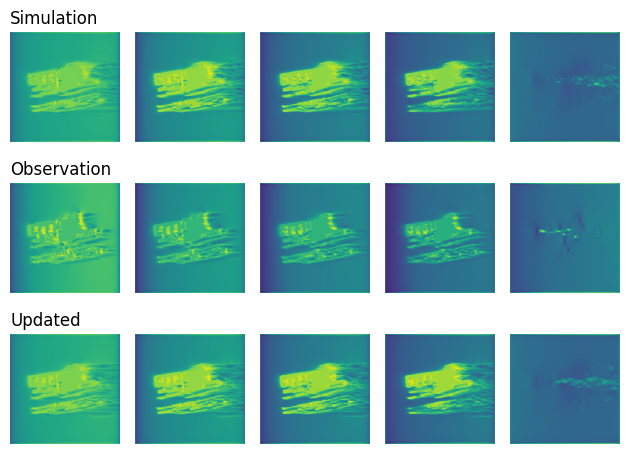

In [ ]:
visualize_da_result(recon_progress=data[4], init_data=data[9], obs_data=data[0], channel=0)

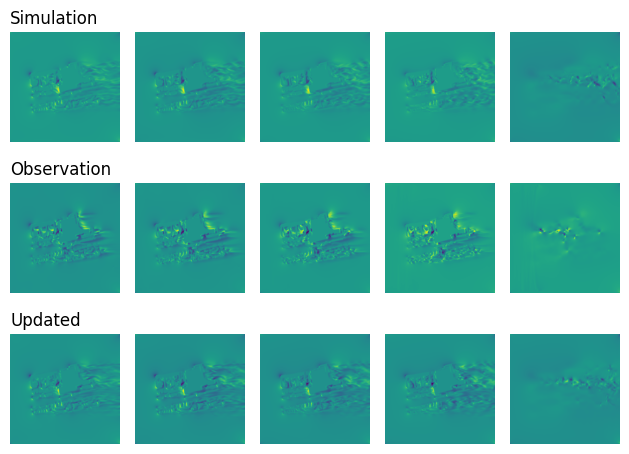

In [ ]:
visualize_da_result(recon_progress=data[4], init_data=data[9], obs_data=data[0], channel=1)

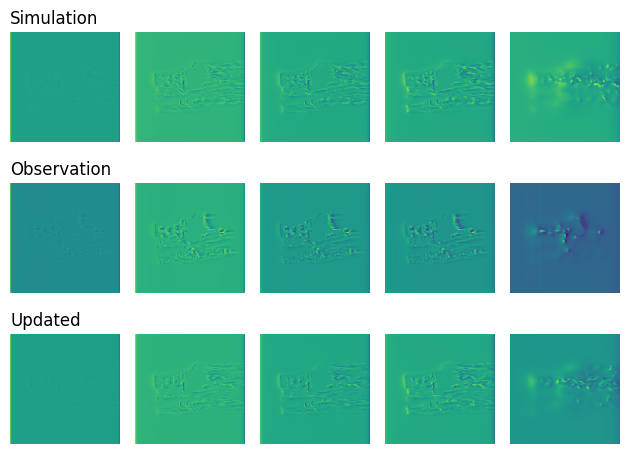

In [ ]:
visualize_recon_progress(recon_progress=data[4], init_data=data[9], obs_data=data[0], channel=2)

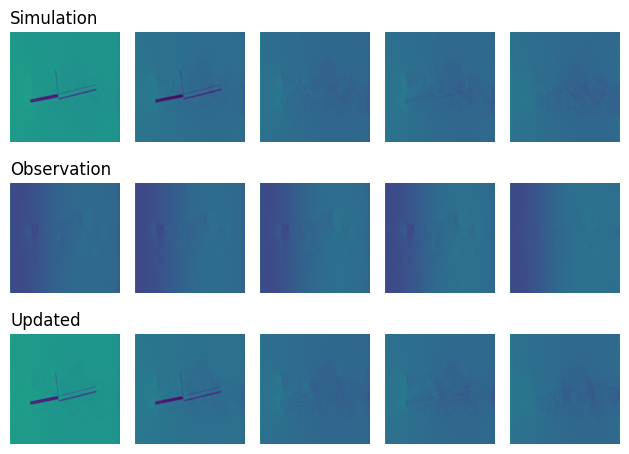

In [ ]:
visualize_recon_progress(recon_progress=data_p[4], init_data=data_p[9], obs_data=data_p_original[1], channel=0)

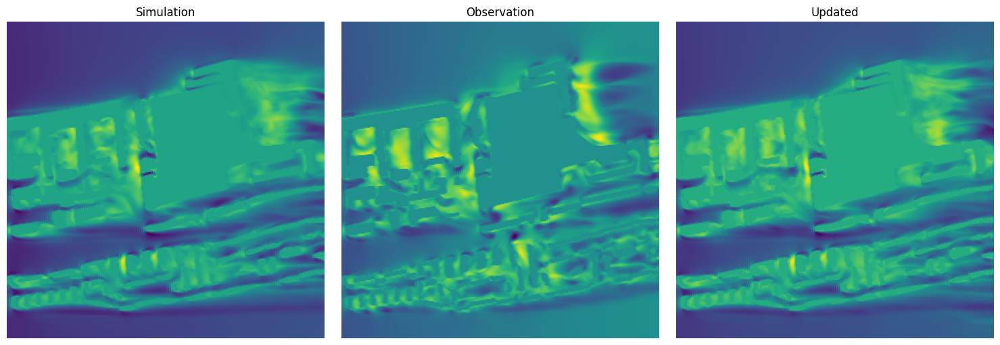

In [30]:
visualize_da_detail(recon_progress=data[4], init_data=data[9], obs_data=data[0], channel=0, x_start=100, x_end=400, y_start=100, y_end=400)

### Sensor Error

In [143]:
# Copy the result and visualise it

mismatch = np.array([0.03577, 0.02062, 0.01538, 0.00641, 0.00328, 0.00203, 0.00197, 0.00103, 0.00088, 0.00086, 0.00084, 0.00083, 0.00081, 0.00080, 0.00079, 0.00078], dtype=np.float32)

s1c1 = np.array([0.7264, 0.5350, 0.4518, 0.4352, 0.4200, 0.3846, 0.3154, 0.2783, 0.2436, 0.1982, 0.1837, 0.1724, 0.1592, 0.1508, 0.1455, 0.1428], dtype=np.float32)
s1c2 = np.array([0.6892, 0.4211, 0.4298, 0.4084, 0.4295, 0.3823, 0.3525, 0.2998, 0.2765, 0.2332, 0.2092, 0.1927, 0.1868, 0.1809, 0.1754, 0.1702], dtype=np.float32)
s1c3 = np.array([0.7104, 0.4523, 0.4711, 0.4276, 0.4600, 0.4128, 0.3745, 0.3324, 0.2889, 0.2554, 0.2223, 0.2103, 0.2043, 0.1999, 0.1963, 0.1938], dtype=np.float32)
s1p  = np.array([0.6053, 0.4150, 0.3652, 0.3345, 0.3265, 0.2923, 0.2610, 0.1959, 0.1603, 0.1451, 0.1307, 0.1234, 0.1198, 0.1165, 0.1137, 0.1107], dtype=np.float32)

s2c1 = np.array([0.6088, 0.5616, 0.4669, 0.4939, 0.3812, 0.2461, 0.2140, 0.1843, 0.1567, 0.1310, 0.1243, 0.1199, 0.1145, 0.1092, 0.1073, 0.1044], dtype=np.float32)
s2c2 = np.array([0.5047, 0.1022, 0.0167, 0.0482, 0.0994, 0.0694, 0.0415, 0.0256, 0.0115, 0.0290, 0.0201, 0.0198, 0.0143, 0.0112, 0.0108, 0.0120], dtype=np.float32)
s2c3 = np.array([0.5461, 0.2873, 0.1136, 0.3174, 0.2032, 0.1740, 0.1468, 0.1215, 0.0978, 0.1157, 0.1083, 0.1026, 0.0924, 0.0921, 0.0900, 0.0888], dtype=np.float32)
s2p  = np.array([0.6000, 0.6255, 0.5104, 0.4330, 0.3740, 0.3470, 0.2900, 0.2778, 0.2393, 0.2012, 0.1728, 0.1726, 0.1684, 0.1662, 0.1599, 0.1587], dtype=np.float32)

s3c1 = np.array([0.7478, 0.4872, 0.4372, 0.3923, 0.2545, 0.1721, 0.1384, 0.1001, 0.0648, 0.0472, 0.0408, 0.0383, 0.0354, 0.0332, 0.0299, 0.0302], dtype=np.float32)
s3c2 = np.array([0.3431, 0.2510, 0.2259, 0.2032, 0.1827, 0.1642, 0.1475, 0.1325, 0.0405, 0.0703, 0.0634, 0.0610, 0.0698, 0.0628, 0.0587, 0.0577], dtype=np.float32)
s3c3 = np.array([0.1997, 0.1797, 0.1617, 0.1454, 0.1309, 0.1078, 0.0760, 0.0454, 0.0263, 0.0141, 0.0182, 0.0163, 0.0113, 0.0108, 0.0101, 0.0100], dtype=np.float32)
s3p  = np.array([0.5523, 0.4056, 0.2973, 0.2267, 0.2104, 0.1407, 0.1140, 0.0902, 0.0763, 0.0502, 0.0482, 0.0467, 0.0492, 0.0453, 0.0441, 0.0473], dtype=np.float32)

s4c1 = np.array([0.7050, 0.4707, 0.4376, 0.4011, 0.3840, 0.3275, 0.2924, 0.2587, 0.2354, 0.2123, 0.2004, 0.1896, 0.1899, 0.1709, 0.1632, 0.1583], dtype=np.float32)
s4c2 = np.array([0.7225, 0.3864, 0.3541, 0.3179, 0.3077, 0.2752, 0.2507, 0.2472, 0.2224, 0.2086, 0.1683, 0.1587, 0.1582, 0.1525, 0.1490, 0.1487], dtype=np.float32)
s4c3 = np.array([0.6377, 0.3001, 0.2586, 0.2208, 0.2004, 0.1791, 0.1977, 0.1785, 0.1503, 0.1312, 0.1212, 0.1021, 0.1014, 0.1042, 0.0992, 0.0964], dtype=np.float32)
s4p  = np.array([0.5529, 0.2171, 0.1776, 0.1373, 0.1156, 0.0952, 0.0859, 0.0886, 0.0743, 0.0628, 0.0629, 0.0645, 0.0676, 0.0621, 0.0678, 0.0665], dtype=np.float32)

s5c1 = np.array([0.6299, 0.4864, 0.3314, 0.3268, 0.2854, 0.2360, 0.1924, 0.1733, 0.1762, 0.1704, 0.1628, 0.1593, 0.1532, 0.1521, 0.1498, 0.1463], dtype=np.float32)
s5c2 = np.array([0.6823, 0.4549, 0.3599, 0.3379, 0.3164, 0.2955, 0.2750, 0.2165, 0.1977, 0.1792, 0.1483, 0.1427, 0.1398, 0.1382, 0.1390, 0.1322], dtype=np.float32)
s5c3 = np.array([0.6543, 0.5164, 0.3286, 0.3702, 0.3219, 0.2734, 0.2249, 0.1963, 0.1728, 0.1428, 0.1372, 0.1326, 0.1289, 0.1224, 0.1122, 0.1083], dtype=np.float32)
s5p  = np.array([0.5009, 0.4761, 0.4227, 0.4299, 0.2476, 0.1860, 0.1850, 0.1446, 0.1257, 0.1072, 0.0894, 0.0710, 0.0647, 0.0604, 0.0547, 0.0553], dtype=np.float32)


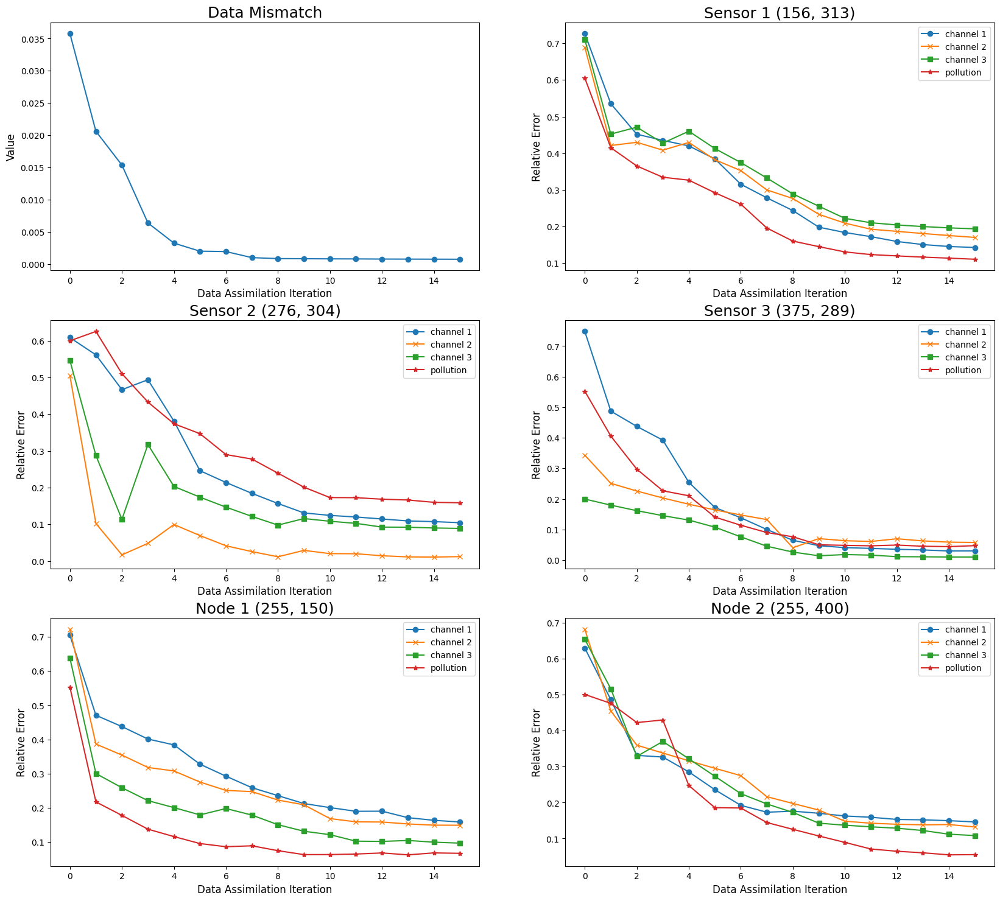

In [144]:
visualize_sensor(mismatch, s1c1, s1c2, s1c3, s1p, s2c1, s2c2, s2c3, s2p, s3c1, s3c2, s3c3, s3p, s4c1, s4c2, s4c3, s4p, s5c1, s5c2, s5c3, s5p)